In [391]:
import autograd.numpy as np
import matplotlib.pyplot as plt
import size_contrast_analysis as sca
import pyute as ut
import scipy.optimize as sop
import sim_utils
from autograd import grad
%matplotlib notebook


In [566]:
npyfile = np.load('../shared_data/calnet_data/vip_halo_data_for_sim.npy',allow_pickle=True)[()]
Yhat_halo_orig = npyfile['Yhat_orig']
Yhat_halo = npyfile['Yhat_opto']
scall_halo = npyfile['scallanimal_aligned']
Yhat_halo = Yhat_halo/np.nanmax(Yhat_halo[0::2],0)[np.newaxis,:]

npyfile = np.load('../shared_data/calnet_data/vip_chrimson_data_for_sim.npy',allow_pickle=True)[()]
Yhat_chrimson_orig = npyfile['Yhat_orig']
Yhat_chrimson = npyfile['Yhat_opto']
scall_chrimson = npyfile['scallanimal_aligned']
Yhat_chrimson = Yhat_chrimson/np.nanmax(Yhat_chrimson[0::2],0)[np.newaxis,:]

<IPython.core.display.Javascript object>


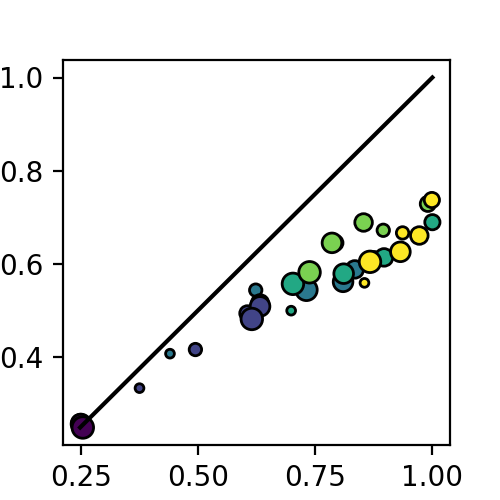

<IPython.core.display.Javascript object>


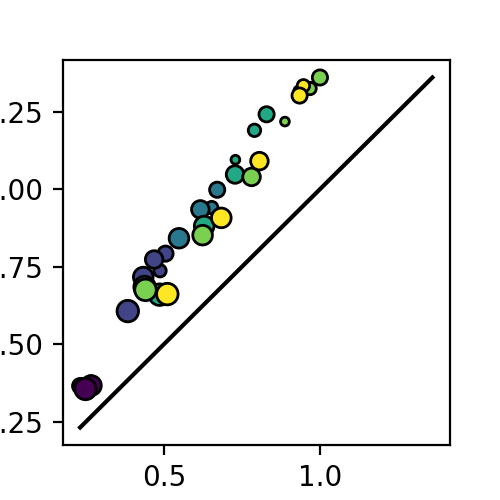

In [4]:
itype = 0

plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast(Yhat_halo[0::2,itype],Yhat_halo[1::2,itype],nsize=6,ncontrast=6)
plt.figure(figsize=(2.5,2.5))
sca.scatter_size_contrast(Yhat_chrimson[0::2,itype],Yhat_chrimson[1::2,itype],nsize=6,ncontrast=6)

In [5]:
dYY_halo = Yhat_halo[1::2]-Yhat_halo[0::2]
dYY_chrimson = Yhat_chrimson[1::2]-Yhat_chrimson[0::2]

In [33]:
YY_halo_orig,YY_halo_orth = [Yhat_halo_orig[0][0][iangle] for iangle in range(2)]
dYY_halo_orig = YY_halo_orig[:,:,:,1]-YY_halo_orig[:,:,:,0]
YY_chrimson_orig,YY_chrimson_orth = [Yhat_chrimson_orig[0][0][iangle] for iangle in range(2)]
dYY_chrimson_orig = YY_chrimson_orig[:,:,:,1]-YY_chrimson_orig[:,:,:,0]

<IPython.core.display.Javascript object>


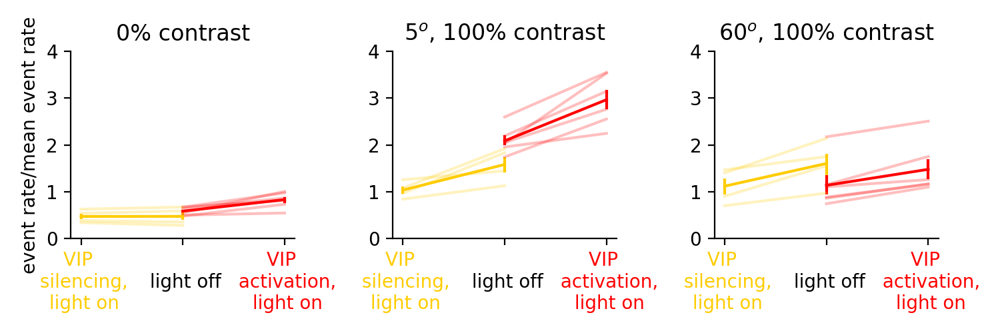

chrimson: WilcoxonResult(statistic=0.0, pvalue=0.027707849358079864)
halo: WilcoxonResult(statistic=5.0, pvalue=0.24886387493792206)
comparison: MannwhitneyuResult(statistic=13.0, pvalue=0.23558499924502785)
chrimson: WilcoxonResult(statistic=0.0, pvalue=0.027707849358079864)
halo: WilcoxonResult(statistic=0.0, pvalue=0.027707849358079864)
comparison: MannwhitneyuResult(statistic=12.0, pvalue=0.18923879662233944)
chrimson: WilcoxonResult(statistic=0.0, pvalue=0.027707849358079864)
halo: WilcoxonResult(statistic=0.0, pvalue=0.027707849358079864)
comparison: MannwhitneyuResult(statistic=12.0, pvalue=0.18923879662233944)


In [567]:
alpha = 0.25

halo_color = np.array((1,0.8,0))
chrimson_color = 'r'

def plot_bars_and_lines(xdata,ydata,alpha=alpha,c='k'):
    plt.plot(xdata,ydata.T,c=c,alpha=alpha)
    lb,ub,mn = ut.bootstrap(ydata,axis=0,pct=(16,84,50),fn=np.nanmean)
    yerr = np.concatenate(((mn-lb)[np.newaxis],(ub-mn)[np.newaxis]),axis=0)
    plt.errorbar(xdata,mn,yerr=yerr,c=c)
    
def opto_bidi_xticks(): 
    plt.xticks((-1,0,1),('VIP \n silencing,\n light on','\n light off','VIP \n activation,\n light on'))
    colors = [halo_color,'k',chrimson_color]
    for xtick, color in zip(plt.gca().get_xticklabels(), colors):
        xtick.set_color(color)
    
ylim = (0,4)

plt.figure(figsize=(7.5,2.5))
plt.subplot(1,3,1)
data = np.nanmean(YY_chrimson_orig[:,:,0],1)
plot_bars_and_lines((0,1),data,c=chrimson_color)
diff_chrimson = data[:,1]-data[:,0]
print('chrimson: '+str(sst.wilcoxon(data[:,0],data[:,1])))
data = np.nanmean(YY_halo_orig[:,:,0],1)
plot_bars_and_lines((0,-1),data,c=halo_color)
diff_halo = data[:,1]-data[:,0]
print('halo: '+str(sst.wilcoxon(data[:,0],data[:,1])))
print('comparison: '+str(sst.mannwhitneyu(diff_chrimson,diff_halo)))
plt.ylim(ylim)
plt.ylabel('event rate/mean event rate')
plt.title(r'0% contrast')
opto_bidi_xticks()
ut.erase_top_right()

ijs = [[0,-1],[-1,-1]]
titles = [r'5$^o$, 100% contrast',r'60$^o$, 100% contrast']

for iij,ij in enumerate(ijs):
    i,j = ij
    plt.subplot(1,3,iij+2)
    # plt.figure(figsize=(2.5,2.5))
    data = YY_chrimson_orig[:,i,j]
    plot_bars_and_lines((0,1),data,c=chrimson_color)
    diff_chrimson = data[:,1]-data[:,0]
    print('chrimson: '+str(sst.wilcoxon(data[:,0],data[:,1])))
    data = YY_halo_orig[:,i,j]
    plot_bars_and_lines((0,-1),data,c=halo_color)
    diff_halo = data[:,1]-data[:,0]
    print('halo: '+str(sst.wilcoxon(data[:,0],data[:,1])))
    print('comparison: '+str(sst.mannwhitneyu(diff_chrimson,diff_halo)))
    plt.ylim(ylim)
    plt.title(titles[iij])
    opto_bidi_xticks()
    ut.erase_top_right()
plt.tight_layout()
plt.savefig('figures/vip_bidi_3_example_plots.jpg',dpi=300)

In [568]:
data = YY_chrimson_orig
contrast_diff = np.zeros_like(data[:,:,:,0])
this_diff = np.diff(data[:,:,:,0],axis=2)
contrast_diff[:,:,1:-1] = 0.5*this_diff[:,:,1:] + 0.5*this_diff[:,:,:-1]
contrast_diff[:,:,0] = this_diff[:,:,0]
contrast_diff[:,:,-1] = this_diff[:,:,-1]
size_diff = np.zeros_like(data[:,:,:,0])
this_diff = np.diff(data[:,:,:,0],axis=1)
size_diff[:,1:-1] = 0.5*this_diff[:,1:] + 0.5*this_diff[:,:-1]
size_diff[:,0] = this_diff[:,0]
size_diff[:,-1] = this_diff[:,-1]

<IPython.core.display.Javascript object>


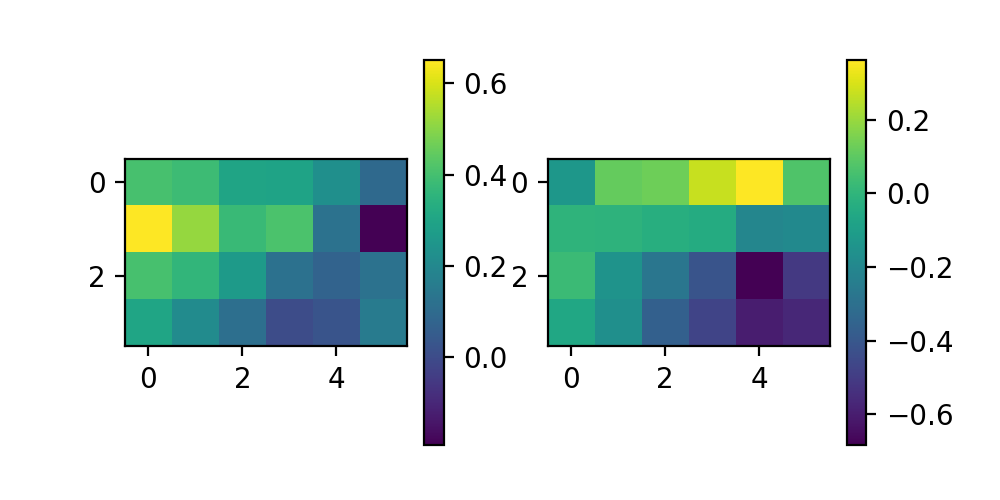

In [569]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.imshow(np.nanmean(contrast_diff,0))
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(np.nanmean(size_diff,0))
plt.colorbar()

<IPython.core.display.Javascript object>


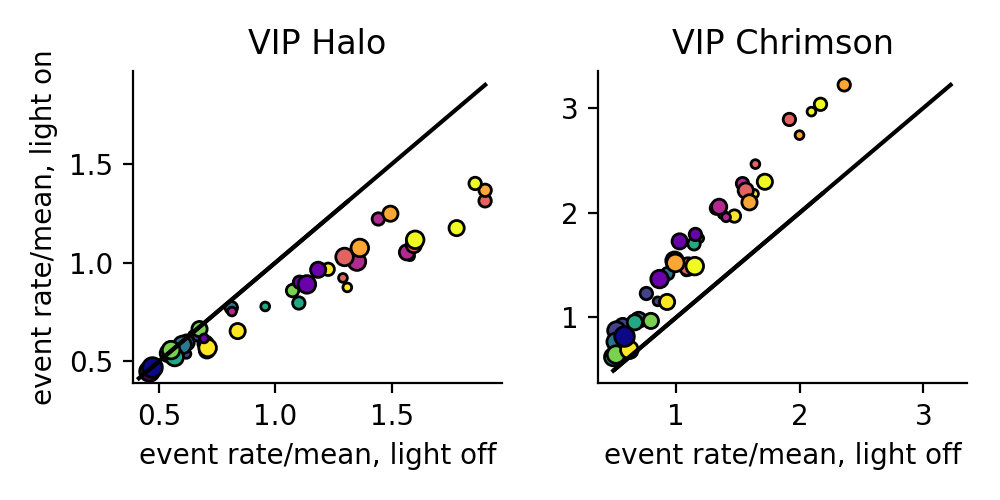

In [570]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
data = np.nanmean(YY_halo_orth,0)
sca.scatter_size_contrast(data[:,:,0],data[:,:,1],equate_0=True)
data = np.nanmean(YY_halo_orig,0)
sca.scatter_size_contrast(data[:,:,0],data[:,:,1],equate_0=True,colormap=plt.cm.plasma)
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.ylabel('event rate/mean, light on')
plt.title('VIP Halo')
plt.subplot(1,2,2)
data = np.nanmean(YY_chrimson_orth,0)
sca.scatter_size_contrast(data[:,:,0],data[:,:,1],equate_0=True)
data = np.nanmean(YY_chrimson_orig,0)
sca.scatter_size_contrast(data[:,:,0],data[:,:,1],equate_0=True,colormap=plt.cm.plasma)
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.title('VIP Chrimson')
plt.tight_layout()
plt.savefig('figures/vip_opto_angle_light_on_light_off_scatter.eps')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


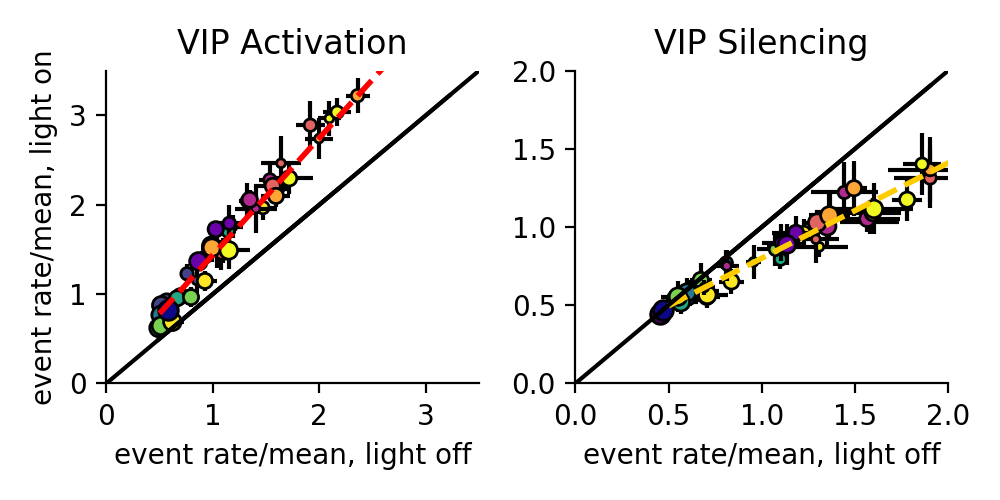

In [1079]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,2)
xdata,ydata = [np.zeros((0,)) for idata in range(2)]
for data,colormap in zip([YY_halo_orth,YY_halo_orig],[plt.cm.viridis,plt.cm.plasma]):
    sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True,colormap=colormap)
    lkat = ~np.isnan(data.sum(1).sum(1).sum(1))
    xdata = np.concatenate((xdata,data[lkat,:,:,0].flatten()))
    ydata = np.concatenate((ydata,data[lkat,:,:,1].flatten()))
slope, intercept, r_value, p_value, std_err = sst.linregress(xdata,ydata)
def lin_transform(x):
    return slope*x+intercept
plt.plot(np.linspace(0.5,3,100),lin_transform(np.linspace(0.5,3,100)),c=np.array((1,0.8,0)),linewidth=2,linestyle='dashed')
# plt.plot(np.linspace(offset,3,100),opto_transform(np.linspace(0.5,3,100),hs[1]),c='m',linewidth=3,linestyle='dashed')
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.title('VIP Silencing')
lim = (0,2)
plt.plot(lim,lim,c='k')
plt.xlim(lim)
plt.ylim(lim)
plt.subplot(1,2,1)
xdata,ydata = [np.zeros((0,)) for idata in range(2)]
for data,colormap in zip([YY_chrimson_orth,YY_chrimson_orig],[plt.cm.viridis,plt.cm.plasma]):
    sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True,colormap=colormap)
    xdata = np.concatenate((xdata,data[:,:,:,0].flatten()))
    ydata = np.concatenate((ydata,data[:,:,:,1].flatten()))
slope, intercept, r_value, p_value, std_err = sst.linregress(xdata,ydata)
def lin_transform(x):
    return slope*x+intercept
plt.plot(np.linspace(0.5,3,100),lin_transform(np.linspace(0.5,3,100)),c='r',linewidth=2,linestyle='dashed')
# plt.plot(np.linspace(offset,3,100),opto_transform(np.linspace(0.5,3,100),hs[0]),c='m',linewidth=3,linestyle='dashed')
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.ylabel('event rate/mean, light on')
plt.title('VIP Activation')
lim = (0,3.5)

plt.plot(lim,lim,c='k')
plt.xlim(lim)
plt.ylim(lim)
plt.tight_layout()
plt.savefig('figures/vip_opto_angle_light_on_light_off_scatter_errorbar_linear_fit.eps')

In [565]:
YY_chrimson_orig.shape

(6, 4, 6, 2)

<IPython.core.display.Javascript object>


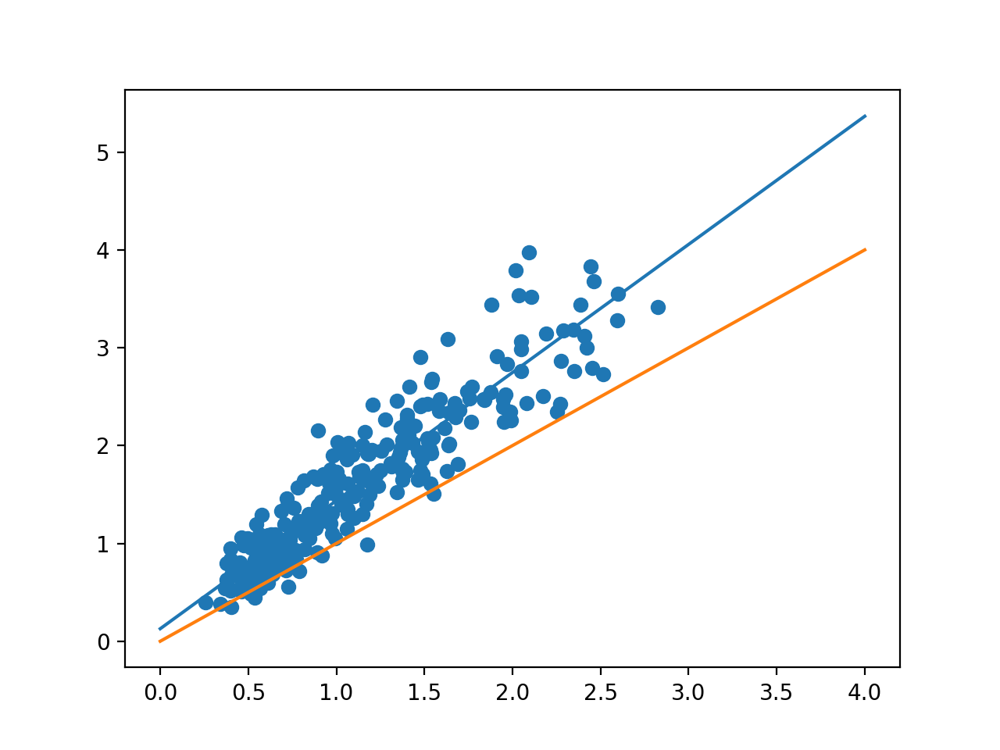

<IPython.core.display.Javascript object>


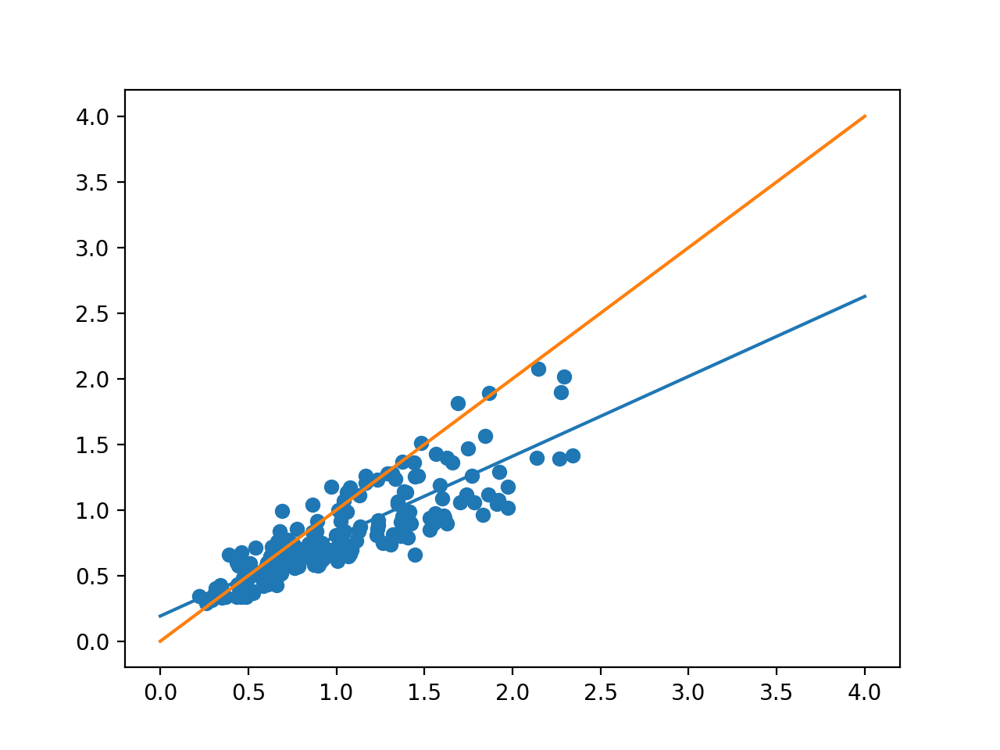

In [572]:
datas = [YY_chrimson_orig,YY_chrimson_orth]
xdata = datas[1][:,:,:,0].flatten()
ydata = datas[1][:,:,:,1].flatten()
xdata = np.concatenate((xdata,datas[0][:,:,:,0].flatten()))
ydata = np.concatenate((ydata,datas[0][:,:,:,1].flatten()))
lkat = ~np.isnan(xdata) & ~np.isnan(ydata)
xdata = xdata[lkat]
ydata = ydata[lkat]
plt.figure()
plt.scatter(xdata,ydata)
import scipy.stats as sst
chrimson_result = sst.linregress(xdata,ydata)
x = np.array((0,4))
plt.plot(x,chrimson_result.slope*x+chrimson_result.intercept)
plt.plot(x,x)

datas = [YY_halo_orig,YY_halo_orth]
xdata = datas[1][:,:,:,0].flatten()
ydata = datas[1][:,:,:,1].flatten()
xdata = np.concatenate((xdata,datas[0][:,:,:,0].flatten()))
ydata = np.concatenate((ydata,datas[0][:,:,:,1].flatten()))
lkat = ~np.isnan(xdata) & ~np.isnan(ydata)
xdata = xdata[lkat]
ydata = ydata[lkat]
plt.figure()
plt.scatter(xdata,ydata)
halo_result = sst.linregress(xdata,ydata)
x = np.array((0,4))
plt.plot(x,halo_result.slope*x+halo_result.intercept)
plt.plot(x,x)

In [78]:
print(chrimson_result)
print(halo_result)

LinregressResult(slope=1.3094375154340903, intercept=0.12797254173512052, rvalue=0.9291023524296828, pvalue=1.4165436906025336e-125, stderr=0.03081993731079288)
LinregressResult(slope=0.6089053806596096, intercept=0.19180839229419877, rvalue=0.860224952521201, pvalue=1.7828893361613263e-57, stderr=0.02618535899386835)


In [80]:
chrimson_result.slope

1.3094375154340903

<IPython.core.display.Javascript object>


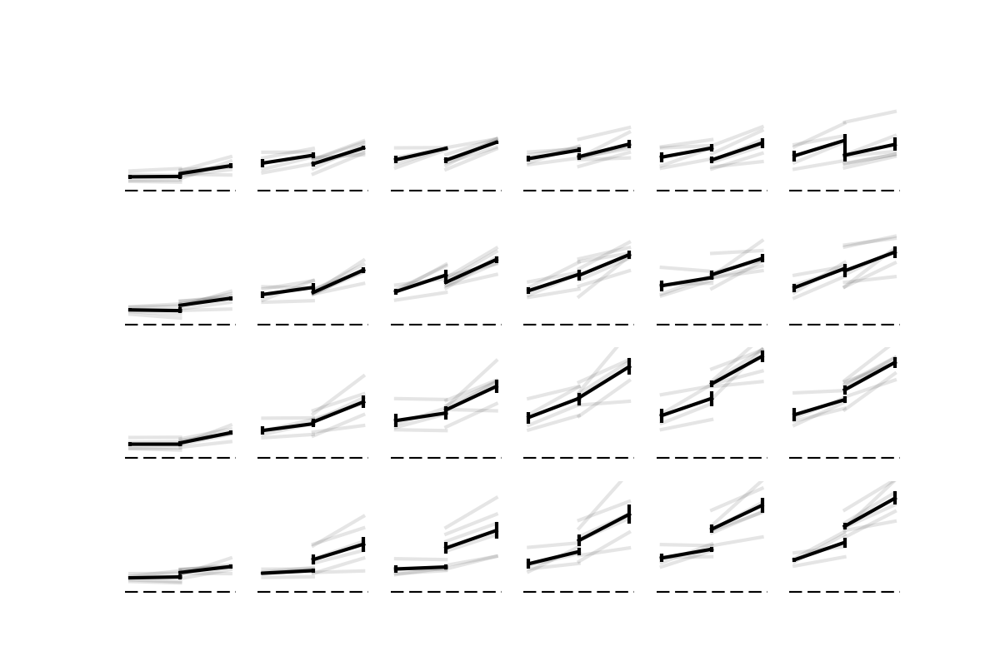

In [573]:
alpha = 0.1
nsize,ncontrast = YY_chrimson_orig.shape[1:3]
plt.figure(figsize=(ncontrast,nsize))
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,ncontrast*(nsize-1-i)+j+1)
        data = YY_chrimson_orig[:,i,j]
        plot_bars_and_lines((0,1),data,alpha=alpha)
        data = YY_halo_orig[:,i,j]
        plot_bars_and_lines((0,-1),data,alpha=alpha)
        plt.axis('off')
        plt.ylim((0,3.5))
        plt.axhline(0,linestyle='dashed',c='k')
plt.savefig('figures/vip_bidi_master_plot.jpg',dpi=300)

<IPython.core.display.Javascript object>


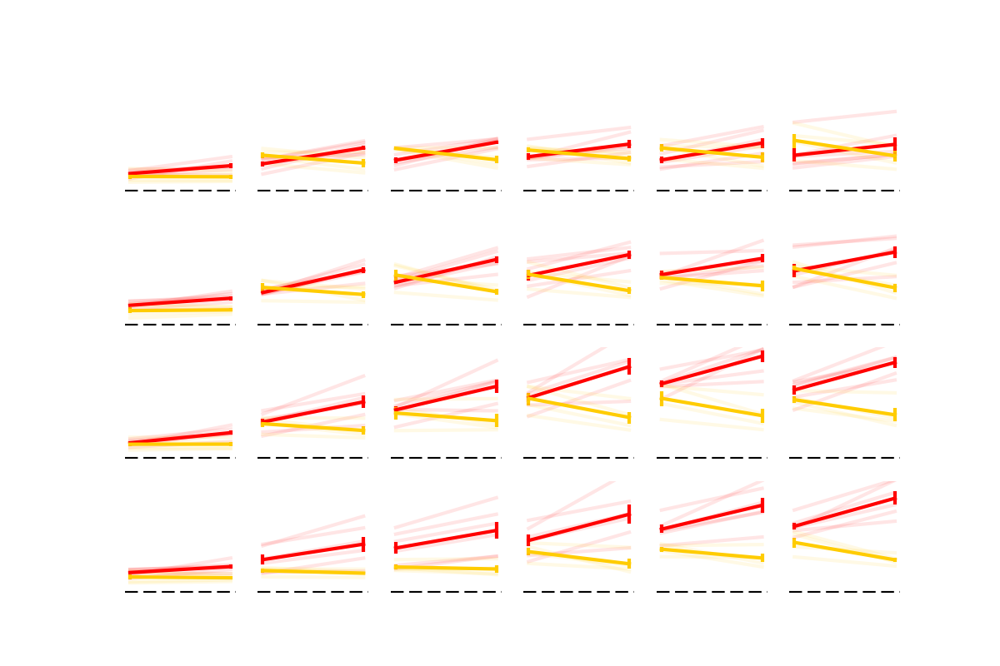

In [574]:
alpha = 0.1
nsize,ncontrast = YY_chrimson_orig.shape[1:3]
plt.figure(figsize=(ncontrast,nsize))
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,ncontrast*(nsize-1-i)+j+1)
        data = YY_chrimson_orig[:,i,j]
        plot_bars_and_lines((0,1),data,alpha=alpha,c='r')
        data = YY_halo_orig[:,i,j]
        plot_bars_and_lines((0,1),data,alpha=alpha,c=np.array((1,0.8,0)))
        plt.axis('off')
        plt.ylim((0,3.5))
        plt.axhline(0,linestyle='dashed',c='k')
# plt.savefig('figures/vip_bidi_master_plot.jpg',dpi=300)

In [1181]:
def invert_f_mt(y,sigma2=1,offset=0,amplitude=1):
    xstar = np.zeros_like(y)
    for iy,yy in enumerate(y):
        if not isinstance(yy,np.ndarray):
            to_invert = lambda x: amplitude*sim_utils.f_miller_troyer(x,sigma2)+offset-yy
            xstar[iy] = sop.root_scalar(to_invert,x0=yy,x1=0).root
        else:
            xstar[iy] = invert_f_mt(yy,sigma2=sigma2,offset=offset,amplitude=amplitude)
    return xstar

def f_mt(x,sigma2=1,offset=0,amplitude=1):
    return amplitude*sim_utils.f_miller_troyer(x,sigma2)+offset

def invert_fn(y,fn,*args):
    xstar = np.zeros_like(y)
    for iy,yy in enumerate(y):
        if not isinstance(yy,np.ndarray):
            to_invert = lambda x: fn(x,*args)-yy
            xstar[iy] = sop.root_scalar(to_invert,x0=yy,x1=0).root
        else:
            xstar[iy] = invert_fn(yy,fn,*args)
    return xstar

def invert_f_mt(y,sigma2=1,offset=1,amplitude=1):
    return invert_fn(y,f_mt,sigma2,offset,amplitude)
    
# def invert_f_mt(y,sigma2=1,offset=0,amplitude=1):
#     xstar = np.zeros_like(y)
#     for iy,yy in enumerate(y):
#         if not isinstance(yy,np.ndarray):
#             to_invert = lambda x: amplitude*sim_utils.f_miller_troyer(x,sigma2)+offset-yy
#             xstar[iy] = sop.root_scalar(to_invert,x0=yy,x1=0).root
#         else:
#             xstar[iy] = invert_f_mt(yy,sigma2=sigma2,offset=offset,amplitude=amplitude)
#     return xstar

def f_power(x,n=1,offset=0,amplitude=1):
    return amplitude*np.maximum(x,0)**n+offset


In [871]:
datas = [YY_chrimson_orth,YY_chrimson_orig]
datas = [YY_halo_orth,YY_halo_orig]
mean_data = np.concatenate([np.nanmean(data,0).reshape((-1,2)) for data in datas],axis=0)
def compute_cost(mean_data,sigma2=sigma2,offset=offset,h=h,amplitude=1):
    xval = invert_f_mt(mean_data[:,0],sigma2=sigma2,offset=offset,amplitude=amplitude)[:,np.newaxis]
    xvals = np.concatenate((xval,xval+h*np.ones_like(xval)),axis=1)
    yvals = f_mt(xvals,sigma2=sigma2,offset=offset,amplitude=amplitude)
    return np.sum((mean_data-yvals)**2),xvals,yvals

hs = np.linspace(-2,2,100)
cost = np.zeros_like(hs)
for ih,h in enumerate(hs):
    cost[ih],xvals,yvals = compute_cost(mean_data,sigma2=8.5,offset=0.,h=h)
hstar = hs[np.argmin(cost)]
hs = np.linspace(0.01,50,100)
cost = np.zeros_like(hs)
for ih,h in enumerate(hs):
    cost[ih],xvals,yvals = compute_cost(mean_data,h,0,hstar)
sigma2star = hs[np.argmin(cost)]

In [965]:
datases = [[YY_chrimson_orth,YY_chrimson_orig],[YY_halo_orth,YY_halo_orig]]
mean_datas = [np.concatenate([np.nanmean(data,0).reshape((-1,2)) for data in datas],axis=0) for datas in datases]
# mean_datas = [np.concatenate([data.reshape((-1,2)) for data in datas],axis=0) for datas in datases]
# mean_datas = [md[~np.isnan(md.sum(1))] for md in mean_datas]

sigma2 = 5.
n = 1.
offset = 0.
amplitude = 3.
hs = np.array((0,0))

p0 = np.concatenate([(sigma2,),(offset,),(amplitude,),hs],axis=0)
bounds = [(0,np.inf),(0,np.inf),(0,np.inf),(-np.inf,np.inf),(-np.inf,np.inf)]

# def compute_cost_bidi(mean_datas,hs=hs,sigma2=sigma2,offset=offset,amplitude=amplitude):
#     yvals = [None for idata in range(len(mean_datas))]
#     cost = 0
#     for idata,mean_data in enumerate(mean_datas):
#         xval = invert_f_mt(mean_data[:,0],sigma2=sigma2,offset=offset,amplitude=amplitude)[:,np.newaxis]
#         xvals = np.concatenate((xval,xval+hs[idata]*np.ones_like(xval)),axis=1)
#         yvals = f_mt(xvals,sigma2=sigma2,offset=offset,amplitude=amplitude)
#         cost = cost + np.sum((mean_data-yvals)**2/mean_data**2)
#     return cost

def compute_cost_bidi(mean_datas,fn,hs,*args):
    yvals = [None for idata in range(len(mean_datas))]
    cost = 0
    for idata,mean_data in enumerate(mean_datas):
        xval = invert_fn(mean_data[:,0],fn,*args)[:,np.newaxis]
        xvals = np.concatenate((xval,xval+hs[idata]*np.ones_like(xval)),axis=1)
        yvals = fn(xvals,*args)
        cost = cost + np.sum((mean_data-yvals)**2/mean_data**2)
    return cost

# def compute_cost_bidi_optimize_x(mean_datas,sigma2=sigma2,offset=offset,amplitude=amplitude,hs=hs):
#     yvals = [None for idata in range(len(mean_datas))]
#     cost = 0
#     for idata,mean_data in enumerate(mean_datas):
#         yvals = y_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=hs[idata])
#         cost = cost + np.sum((mean_data-yvals)**2/mean_data**2)
#     return cost

def compute_cost_bidi_optimize_x(mean_datas,fn,hs,*args,wts=np.array((1,1))):
    yvals = [None for idata in range(len(mean_datas))]
    cost = 0
    for idata,mean_data in enumerate(mean_datas):
        yvals = y_optimize_x(mean_data,fn,hs[idata],*args)
        cost = cost + np.sum((mean_data-yvals)**2/mean_data**2)*wts[idata]
    return cost

# def y_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=hs[0]):
#     _,yvals = xy_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=h)
#     return yvals

def y_optimize_x(mean_data,fn,h,*args):
    _,yvals = xy_optimize_x(mean_data,fn,h,*args)
    return yvals

# def xy_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=hs[0]):
#     xvals = x_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=h)
#     yvals = f_mt(xvals,sigma2=sigma2,offset=offset,amplitude=amplitude)
#     return xvals,yvals

def xy_optimize_x(mean_data,fn,h,*args):
    xvals = x_optimize_x(mean_data,fn,h,*args)
    yvals = fn(xvals,*args)
    return xvals,yvals

# def x_optimize_x(mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=hs[0],x0_lb=-5):
#     shp = mean_data.shape
#     this_mean_data = mean_data.reshape((-1,2))
#     x_inv = invert_f_mt(this_mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude)
#     x_inv[:,1] = x_inv[:,1] - h
#     x0 = np.mean(x_inv,axis=1)
#     x0 = np.maximum(x0,x0_lb)
#     result = sop.minimize(optimize_x_cost,x0,args=(this_mean_data,sigma2,offset,amplitude,h))
#     xval = result.x
# #     xval = x0
#     xvals = np.concatenate((xval[:,np.newaxis],xval[:,np.newaxis]+h),axis=1)
#     xvals = xvals.reshape(shp)
#     return xvals

def x_optimize_x(mean_data,fn,h,*args,x0_lb=-5):
    shp = mean_data.shape
    this_mean_data = mean_data.reshape((-1,2))
    x_inv = invert_fn(this_mean_data,fn,*args)
    x_inv[:,1] = x_inv[:,1] - h
    x0 = np.mean(x_inv,axis=1)
    x0 = np.maximum(x0,x0_lb)
    result = sop.minimize(optimize_x_cost,x0,args=(this_mean_data,fn,h,*args))
    xval = result.x
#     xval = x0
    xvals = np.concatenate((xval[:,np.newaxis],xval[:,np.newaxis]+h),axis=1)
    xvals = xvals.reshape(shp)
    return xvals

# def optimize_x_cost(xval,mean_data,sigma2=sigma2,offset=offset,amplitude=amplitude,h=hs[0]):
#     xvals = np.concatenate((xval[:,np.newaxis],xval[:,np.newaxis]+h),axis=1)
#     yvals = f_mt(xvals,sigma2=sigma2,offset=offset,amplitude=amplitude)
#     cost = np.sum((mean_data-yvals)**2/mean_data**2)
#     return cost

def optimize_x_cost(xval,mean_data,fn,h,*args):
    xvals = np.concatenate((xval[:,np.newaxis],xval[:,np.newaxis]+h),axis=1)
    yvals = fn(xvals,*args)
    cost = np.sum((mean_data-yvals)**2/mean_data**2)
    return cost

# def parse_p(p):
#     sigma2 = p[0]
#     offset = p[1]
#     amplitude = p[2]
#     hs = p[3:]
#     return sigma2,offset,amplitude,hs

def parse_p_f_mt(p):
    sigma2 = p[0]
    offset = p[1]
    amplitude = p[2]
    hs = p[3:]
    return hs,sigma2,offset,amplitude

def parse_p_f_power(p):
    n = p[0]
    offset = p[1]
    amplitude = p[2]
    hs = p[3:]
    return hs,n,offset,amplitude

def compute_cost_bidi_vector(p,fn=f_mt,parse_p_fn=parse_p_f_mt):
    hs,*args = parse_p_fn(p)
    return compute_cost_bidi(mean_datas,fn,hs,*args)
#     args = parse_p_fn(p)
#     return compute_cost_bidi(mean_datas,fn=fn,*args)
#     return compute_cost_bidi(mean_datas,fn=fn,*parse_p_fn(p))

def compute_cost_bidi_optimize_x_vector(p,fn=f_mt,parse_p_fn=parse_p_f_mt,wts=np.array((1,1))):
    hs,*args = parse_p_fn(p)
    return compute_cost_bidi_optimize_x(mean_datas,fn,hs,*args,wts=wts)
#     args = parse_p_fn(p)
#     return compute_cost_bidi_optimize_x(mean_datas,fn=fn,*args)
#     return compute_cost_bidi_optimize_x(mean_datas,fn=fn,*parse_p_fn(p))


In [1197]:
sigma2 = 1.#5.
n = 1.
offset = 0.
amplitude = 1.
hs = np.array((1,-1))

p0 = np.concatenate([(sigma2,),(offset,),(amplitude,),hs],axis=0)
bounds = [(0,np.inf),(0,np.inf),(0,np.inf),(-np.inf,np.inf),(-np.inf,np.inf)]

# result = sop.minimize(compute_cost_bidi_vector,p0,bounds=bounds)
# sigma2,offset,amplitude,hs = parse_p(result.x)
# result = sop.minimize(compute_cost_bidi_optimize_x_vector,p0,args=(f_mt,parse_p_f_mt,np.array((0.01,1))),bounds=bounds)#,jac=grad(compute_cost_bidi_optimize_x_vector))
# hs,sigma2,offset,amplitude = parse_p_f_mt(result.x)
result = sop.minimize(compute_cost_bidi_optimize_x_vector,p0,args=(f_power,parse_p_f_power,np.array((0.01,1))),bounds=bounds)
hs,n,offset,amplitude = parse_p(result.x)


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11261098739880243 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.2891798239000525 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.13059542444963165 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.16896328874258082 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006020262328747216 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.35366211936484065 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.4969736529722586 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.09825919797592604 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.21957795461343652 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06314873791128883 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.081

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.16896328669178906 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006020262267016204 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03969215406875344 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.22456264027217074 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.25500831662040346 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0003569371923812487 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0003569371955529291 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00035694785494858755 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0003569371883519715 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05776047524781294 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.057760487473584456 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.2197587600414885 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.07412364055577927 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.10914357294213088 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.16014319966055193 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.18

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.02365770869279361 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.09801638251901745 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06467299236174831 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.030387486259369385 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.042398927098318176 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.007612618816311232 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01623184892202118 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0008715850637320898 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0432454899155882 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12286989849531092 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0038718979702939966 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01238882605922431 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03908901220951863 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11784310772696671 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08250991762836948 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.004319934497614111 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.012863701201209178 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.039653238788927264 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11871500151921911 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08323585381763862 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.004319934449922855 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.012863701056885364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0396532383232317 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11871499997345641 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08323585277789235 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006132139076592406 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.014784624133251949 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04193620524868723 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12224561302963609 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0861743999834703 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.010240684723713301 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01934677191507104 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0031377130158142647 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04805844298531607 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1341366493211273 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.07919786580531689 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01806233054328104 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0403781766012387 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.047796559108131756 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04726750858433524 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.008866708423667569 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.017821143727370873 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0018772383770730846 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04601067293683198 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.13015199500712415 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0064502104852598415 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015137828995895478 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04241006323664887 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12316361620923194 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08687734745417212 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.049979641264144545 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05784376897600957 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03085638153431425 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04357119257817438 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05753605520982516 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00650476815097815 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01519841259379248 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04249134387088677 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12332112069039475 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08699793817729491 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03017738407896007 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.042798700515317034 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05665490527117273 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.007507547368506169 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.016311931405965634 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.055006029263155475 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00652582708195565 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015221797469081368 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.042522717823631026 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12338191981872614 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.007171587424226012 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015938874103841476 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0003222574834564678 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04348481564274001 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12524719852563 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.049828224675737304 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0628574704197255 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03478765743119031 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04983960362943309 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.07968525554092191 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006954029172976459 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01569729163814577 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00012269482944369742 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04316067906232623 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12461860093073457 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006538043726860122 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015235364281403941 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04254092232439223 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12341720729826441 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08707150077729688 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04254092182205403 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1234172056824709 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08707149968368459 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04983399610291291 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06286397805356037 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.034

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006812212752257862 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015539812663157973 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04294938666414556 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12420892764175526 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08767758544996672 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006905773446716022 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015643705940798766 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -7.84317425303769e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.043088779874187993 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12447918168054034 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00681238696469797 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015540006115411587 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04294964621664082 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12420943082745385 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08767797061410175 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006838610593807855 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015569125838964274 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.6825220538311756e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04298871585941332 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12428517518617416 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.016490962963501502 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.001382205610100627 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.02686703367599741 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.008449005006577779 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06006094315256347 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.008170808596128726 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01713286322775586 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0011768231504993044 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.045359418098475324 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12971960886455902 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04299616354564433 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12431565094573109 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08775505406501888 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05032389186897108 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06341849070110067 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0068124018729636355 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015540025155156043 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04294967976668436 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242095202437818 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08767803263007545 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006812427825537857 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015540055599206848 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0429497258421481 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242096254386169 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08767810897379513 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006825503441020205 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01555539407941956 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.197184006774785e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04297293972961025 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242626258191112 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006834136418425075 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015565521009292366 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.171838277238784e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04298826614099735 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12429761890265212 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006825506258359011 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015555397384313009 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.199638512900019e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.042972944731352145 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242626372389188 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006825641903184177 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015555556503150844 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.317814243098646e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04297318554738373 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12426318706201009 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04297318503939057 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12426318543316907 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08771697914308486 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05029863956994953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06338897982764277 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.03

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006829899964568182 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015560549884693058 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.028645177862522e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0429807379607226 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12428041774152146 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.048094477749123364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.055816968190604575 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.029296923211356535 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.041798155595579076 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.05551487958011157 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006828456162615695 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015558856229512077 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6.770780622410938e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0429781747292496 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242745654102355 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006825653980020685 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01555556911838628 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.329475922347325e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0429731999045834 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12426320702022568 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0068256542767234024 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015555569466434866 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.329734414050616e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04297320043133234 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12426320822288141 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.006827055187504733 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.015557212810972689 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -5.5502288477121675e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04297568752535231 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1242688866821607 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.018706817857533708 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0019316435852219076 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.030332646162120395 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.009754936514057554 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06807722395122412 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.13146599071705115 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.23084247054524953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.2681964323022455 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.2654579485987163 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.30624631801386815 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.1760

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.039728289068238526 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.010542942479579397 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.061026169451997986 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.005307093734236142 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.023925405503731505 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.13611050580237527 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.44013274417775367 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.28746654416837364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.15836739048878104 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.20054859398761618 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01547991056122835 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.06938927836352347 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.27625055882584787 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.17417661878489138 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.08508636472720534 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.11

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.02496091781150088 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.24677083003363098 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.13383179701063508 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04071591302437154 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.07083922219822049 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.00

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.27020712471910147 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.12341140091676496 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.012620044622444877 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.04721104946179843 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.01264840262164689 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.642999529471792 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.9934710394257176 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.07053755671444861 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.6121832711528762 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.6429996013332975 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.9934710

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.661695377344459 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.9968036215754503 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.0707010843210534 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.6141024350946384 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4.661695449513535 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.996803634

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14.888457986998903 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.567312363285186 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.02505964121274773 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.635465588411676 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.02536636926223675 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -2.3752004

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.32558245406956754 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -146.33180538127718 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -36.56114494406621 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.8752833132077842 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.137090505913003 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.87868259

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.3263160934950041 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -146.50969765030513 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -36.60624072472774 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.8780645059097743 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.147667588107781 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.881468140

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.3269300806169058 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -146.65824125616402 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -36.64390324278579 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.8803895706098748 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.156504432894213 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.883796843

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.3270140571754314 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -146.71559006040854 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -36.65762664267223 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.8809782040435898 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.159355788247877 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.884386644

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.0958339966010286 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -814.1258224863818 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -192.92332906817794 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.01009291477838 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -39.57676550278513 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -8.02623174365

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.5030875772204482 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -277.96178003937337 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -67.80314811147167 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.1725748532582276 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14.549730433222187 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.17858918

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -7.703677444448072e+17 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.2688925903605944e+17 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -477047855221857.9 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.4284391775230324e+16 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -480425143849742.25 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.5032210593952979 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -279.3130910154137 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -68.1048327054603 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.1815670545142574 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14.605680075594181 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.1876037767

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4904.781815103235 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.908782797223212e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.706958554395046e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.392648972121934e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.514813043531307e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.52109338867547e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.600817807489912e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.888430934410011e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7273481081590795e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7997234395978105e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.521094718236636e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6008183279628695e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.88843200733837e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.727350083765598e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.79972419976031e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.521096173280262e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.600819974943187e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.888436238447129e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.727349175439924e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.799726914602954e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.1116606861237894e+17 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -5.695517086489812e+16 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -537588854212411.8 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -7658835373215377.0 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -539977425519995.44 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3.5

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4907.603416723658 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.903067479647635e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7012744841394246e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.385323200877314e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.5084392131336155e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.515798580117271e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.597020750986142e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879435234933107e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252551481714885e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.793738731704281e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.515799908158748e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5970212709286114e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.87943630681587e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252571214176294e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.793739491110128e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.5158013621026025e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5970229166634883e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879440534859002e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252562144049554e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.793742203943967e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6.999295139657167e+16 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -4827472875333520.0 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1473058702395356.0 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4920792165645785e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.57948088923651e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.8

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.492078982708558e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.579480752932707e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.836602549641517e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7121707078627265e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7656612977752566e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.492080303628343e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.579481270358697e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.836603616425375e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7121726645035552e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.765662053541181e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.492081753625675e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.579482910869984e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.836607830962949e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7121717673725614e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.765664757730314e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.51579832440183e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.597020525109191e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879434640873478e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252549702255344e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7937383554805075e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.5157980893822645e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5970203881899044e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879434349014857e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.725254877055388e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7937381509637864e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.515799417423573e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5970209081323424e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879435420897487e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252568503011858e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.793738910369541e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.515800871367383e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5970225538671e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.879439648940315e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7252559432884366e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.793741623203232e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.499974543467452e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5853202248034344e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.850862826306167e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7165216745988205e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.775009034001402e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.499974309224098e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.58532008829465e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.850862535301556e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7165215818743223e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7750088300900847e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4999756325142835e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5853206065584386e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.850863603782953e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.716523544034985e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7750095870676965e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4999770838268635e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.585322248809834e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.850867822819462e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7165226436206488e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7750122941366276e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.49470971240824e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.581426493988723e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.841354152634618e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7136198960761274e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.768776013808397e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.49470947842309e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5814263576165945e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.841353861914176e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7136198034998332e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7687758100985015e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.494710800132641e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.581426875321727e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.841354929263743e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7136217619787906e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.768776566268138e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.494712250568479e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.581428516412917e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.841359145300542e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7136208637546448e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.768779271416999e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.493419642929139e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.58047232770244e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.839024011664289e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.712909157360852e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.767248591833417e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.493419409007409e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5804721913638296e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.839023721013566e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7129090648207116e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.767248388172909e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4934207303295675e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.580472708932039e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.83902478808568e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7129110223981643e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.7672491441444925e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.493422180550343e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.580474349738871e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.839029003387274e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7129101247103683e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.767251848822772e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.5627079077527158e+17 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -2.8895053111636492e+16 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -168015470396866.4 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3654995232314009.0 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -169008875633114.28 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -5695.057823642 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.7561157168671375e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5825467973124317e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.894941589265986e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.221349045980551e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.458268314969962e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.761429741245128e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.818582583786921e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2988456169633466e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.448560372716733e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4582693334872765e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7614301423811533e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.818583411927533e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.298847094238719e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.448560959049134e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4582706074834853e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7614315331930022e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.818586973055152e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2988464805881726e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.448563247171161e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.334428647338541e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6969680192349855e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.668390958651265e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003071543942564384 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00013074644820852452 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -21755.25048804792 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6280914998316087e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.365088282602134e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7449800340243226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.084986011945628e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.334428447810595e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.696967895672406e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.668390687813237e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003071543881649727 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00013074644502291332 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -21755.250873501624 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.628091285597742e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3650880687345333e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7449797640821137e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.0849857748165196e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3344294465726875e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6969683051112877e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.6683915422013274e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00030715440922556036 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001307464553331129 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -21755.258434410454 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.628092307079743e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3650899005030246e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.744980923766406e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.0849868475540344e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.334432714191666e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6969713086054455e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.668399091785915e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00030715476886777866 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00013074660767240412 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -21755.234665360196 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6280959248518207e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3650923868492326e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7449858212634837e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.084990994219655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4574408722648274e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.251111852104224e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.118587891077341e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006200739962734894 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5526129931325807e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4574407914701502e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2511118005144514e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1185877787743995e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006200739840471741 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5526127844820836e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4574412103148445e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.251111982776897e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.118588160663474e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000620074029800289 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5526162363995117e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4574419805311877e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2511128034733619e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.11859026250703e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006200744677520656 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5526156946080617e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.885173392433268e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.158140642629533e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.813916566797696e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00036040523929129094 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015338460464719373 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -19481.46917204316 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.2300751832467956e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8853890876827034e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.539552658934735e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.765991009396012e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.885173161722144e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1581404994263735e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.813916253131402e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003604052323157996 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015338460098312772 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -19481.4695171711 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.230074935405296e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8853888424165324e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.539552346349194e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.76599073492878e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.23

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8851743211350214e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1581409769820486e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.813917249902858e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00036040525684546797 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015338461300004692 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -19481.47633680009 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.230076122050253e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.885390945572409e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.539553695446405e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7659919820344267e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8851779075170814e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1581443128047746e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.813925647595462e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00036040565811444174 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015338478289799614 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -19481.455672782336 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.2300800991518406e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8853936030173655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.539559096625175e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7659965481056747e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.426668919170395e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1797621422922988e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.466421702383095e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000258949900074855 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001097972837057206 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.541193484010968e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16833.619481460668 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6762358897356734e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0355679176995166e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.597738906078592e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.426668771619599e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1797620410017463e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.466421477022692e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002589498948028568 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010979728097135634 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.541193397285758e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16833.61977962726 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6762357292319714e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0355677852451516e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.59773869836924e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4266694675142805e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.179762367231395e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.466422170205053e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002589499125352638 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001097972896047095 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.5411986712444036e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16833.6267445309 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6762364533912594e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0355687905323953e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.597739550019404e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4266719979580047e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.179764907821745e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.466428637794715e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002589502286045834 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010979742300765066 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.541195439364862e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16833.606742206026 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.676239285156488e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0355705002858217e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5977434706376876e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.832765564541163e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.53581767129408e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.301360211648725e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.856169844880991e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.030933142826748e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.809102091390535e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3944.161490860125 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2516068620549956e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7525110598081824e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.87436569231714e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.832765373894979e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.535817487483602e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.301359778203172e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.856169721334724e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0309330818435395e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.8091018801942554e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3944.1615605376164 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2516066463075446e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.752510756304724e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8743654397751765e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.8327660895012796e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.535818002585459e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.301360945679118e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.8561700677602566e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.030933246367037e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.8091043232060224e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3944.167028844918 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2516074305755384e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.7525117842386036e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8743663259261526e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.8327712505744213e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5358247685196914e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.30137888168674e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.856179592340837e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0309372193879776e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.8091077299248063e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3944.1567705311218 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.251613388801895e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.752520599226581e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.8743734690886983e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2578503317208949e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.275277726189369e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.252885946247445e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015942820868576846 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.727691721065417e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.774144839315003e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12892.847501926155 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4083495916084966e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.680818876114885e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9533891934690406e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2578502527402008e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2752776648553866e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.252885807018287e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015942820520503635 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.727691543511137e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.774144270307991e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12892.847730212185 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4083495044107352e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.680818288969496e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9533890770828668e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2578505966132162e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2752778534953128e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.252886217021806e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001594282162356184 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.727692076156588e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.77415905650386e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12892.85473474688 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4083498693170795e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.680822147353811e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9533895239353763e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2578521502913107e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2752795699557562e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2528906491927683e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015942843918041378 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.727701447760047e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.774157524766553e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12892.83637910789 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4083516277672287e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.680831426640149e-08 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.953392017633065e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2758277424130987e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0704709493429656e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201448567563385e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00024725972142163646 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010478935681875361 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.051063312890319e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16459.91964519487 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.5139344755957097e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8686010222786173e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.390770725917628e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.275827603592555e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.070470852807977e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201448352342501e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002472597163529361 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010478935419424463 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0510632525421232e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16459.91993673114 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.5139343243506046e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8686009002075308e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3907705295493006e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2758282529368708e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.070471162283737e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201449011458291e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002472597333003402 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010478936243859596 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0510665058055354e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16459.926915371496 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.513935001479281e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8686018125974704e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.390771329308081e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2758306656997544e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0704736088500055e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201455248790665e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000247260039018147 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010478949141896843 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0510646629730077e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16459.907033394786 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.513937704728963e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.868603422485315e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.3907750813414403e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699787080907033e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138901431141308e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367427702761279e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458874524785457 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792864142083054 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327909524873477e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29804215468 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615278789842764e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722694345212075e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201111758465625e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699785638173188e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138901331626704e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367427481184281e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458874005150964 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792863872737403 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327908769101832e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29833788619 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615278632812905e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722693059978375e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520110972386613e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699792421828934e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138901651588733e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367428161634351e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887574911154 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286472155863 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327952664882888e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.305308048934 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152793392765376e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972270275923157e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201118045453813e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369981728629338e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389041571718436e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367434543548624e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545890697138088 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792877897479476 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327926511272247e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.28534913516 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152821230169573e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722719481796197e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520115662230027e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.295518765847492e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.2627214643094164e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.338497174940355e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006520655360195823 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002754117083146737 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.842756625768644e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6182.5485956451785 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.914616834124947e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.768495280467618e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.161900300005111e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.295518456127983e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.262721233532444e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3384971233185426e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006520655245334238 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002754117022082991 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.842756336470873e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6182.548704978123 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.914616493329214e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.768495042137999e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.161899848642743e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.8

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.295519894097991e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.262721992587943e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3384972868762629e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006520655669792058 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00027541172289391686 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.842765234734936e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6182.5518906171055 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.914618013198552e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.768496730511174e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.161901693786125e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.295523801682558e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.2627264689541135e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.338498447798773e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006520661560601982 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002754119702133304 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.842761231042607e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6182.545092027663 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.91462245869794e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.7684988641623294e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.161908061658393e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.8

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6344049318078697e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.441835525564734e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.69471016984294e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0004178890505384299 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001768336642924557 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.258342518806928e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -10158.984486890844 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.0349988141094256e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.792950803808313e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.499326632704927e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.634404715179036e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4418353702948352e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.694709823372447e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0004178890426246619 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00017683366013892564 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.258342094011288e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -10158.984666702836 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.034998577033655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.792950624691479e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.499326322137353e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.634405728370436e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.441835875722778e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.694710905161107e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00041788907050936393 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000176833673721105 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.258359285843307e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -10158.989343495827 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.0349996400620775e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.79295193519882e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.499327593350903e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.634408903388377e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.441839286709829e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.694719671185674e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0004178895071762895 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00017683385752852206 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.258350450521215e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -10158.977867537415 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.0350032234479353e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.792953855870285e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.499332642222207e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.978564474046281e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.75597023339003e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.9396795735238705e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00033140853476244987 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00014036304783890977 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.40500249872012e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12897.307078525544 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2972288367717065e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.37773504783386e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4668468868633644e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.978564294748e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7559701072416755e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.939679292339789e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00033140852825797886 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001403630444456578 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.405001955590003e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12897.307306886976 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.297228641065531e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3777348942091528e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4668466318440484e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.978565135724913e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7559705155470374e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.939680163519713e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00033140855064888955 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00014036305534830866 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.405027751918052e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12897.312961477452 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2972295202576704e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3777360353349993e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4668476755911333e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9785679722713154e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.755973470185075e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.93968772394402e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003314089239780608 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001403632126887255 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.405013544570024e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -12897.298044844983 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.297232709257402e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3777378404044816e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.4668521330261336e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6653585060913764e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.435926390073428e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.123360889457422e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002914395096921296 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00012349244598538976 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1056841797031972e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14650.2894812952 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9459209017686334e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1717706371006775e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.9781481444690706e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.665358344767166e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.43592627768083e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.123360639072051e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00029143950386076756 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00012349244295297687 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.105684116386305e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14650.289740747747 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9459207259282655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1717704961986888e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.978147915980812e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.665359102422856e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4359266402929983e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.123361411494446e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002914395236849633 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001234924526039265 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1056874239366193e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14650.296007350653 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9459215165044175e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.171771551123242e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.978148850900451e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.665361763795226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4359293673562144e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.1233683736628525e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002914398658908984 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001234925969211297 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1056855311112025e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -14650.278801358872 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.945924502386641e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1717732915225212e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.9781530067149055e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699823893386879e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389051025787273e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437036063077e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458919921643523 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792883321230574 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332787503460881e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.269605134094 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615282906272279e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722719552461344e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520116866135737e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699822450653958e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138905003064021e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367436814485649e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458919402008 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079288305188449 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332787427883926e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.269900856594 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152827492422123e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722718267231056e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201166626755076e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699829234316843e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389053230265773e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437494936921e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892114597172 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792883900707283 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.33279181744491e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.276871018068 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152834557068026e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97227279664903e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201174948354446e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.36998540988061e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138907828612443e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367443876858479e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545895236827882 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079289707664392 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327892020954158e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.256912134933 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615286239449739e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722744689063002e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520121352523634e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102761472e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298565354e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36743100427501e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890583234363 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926415064 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324444037e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982976843 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459675416e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261894318e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887003053e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660030733e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303419264e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782697894e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006359939 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657069272 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332789656867322e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.288278707336 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280088937608e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976664932e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520112985239875e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699805443686158e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503041376e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674314631483485e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807561215 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505891113 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Toleranc

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332794046439368e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29524886679 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954016096e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972271167591712e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817399474e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308161655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558881983e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845065246e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302984375 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681817511 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310824022e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.275289966525 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152835791425603e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398484528e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675085097e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.477102961238794e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2563546724665674e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.672950011886925e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00027064376039947905 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011460623348013846 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1877341248077401e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15708.955740556019 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7361756893695593e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0374000629339116e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.69065077384055e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4771028108079863e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.256354567884297e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.6729497787282496e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00027064375492925403 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011460623064245063 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1877340570515198e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15708.956018772504 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.736175525490664e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0373999303896338e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6906505611015814e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.477103517722799e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.256354904753156e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.6729504964633335e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002706437734115697 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011460623963132288 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1877377781109956e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15708.962658735327 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.736176262543087e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0374009265677626e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6906514314329364e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.477106056971908e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2563574923215202e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.672957101593972e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002706440986251423 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011460637670677541 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1877356091640448e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15708.944037345354 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7361791088757975e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0374026091528513e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.690655386192006e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2318799576977818e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.310304874913236e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9462316733466802e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.446011638155805e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.005701134492092e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4251116354483955e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1991497407098495e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.524043932368049e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00026280280922761647 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011134629670345739 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2546048945195793e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16177.630783258119 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.677477468989659e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.005942651173798e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6077819911667e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.425111488003774e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1991496385931133e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.524043704846984e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002628028038907452 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011134629393601599 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2546048231513118e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16177.631069787218 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.677477308433916e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0059425205709155e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.607781782933072e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.425112181078849e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1991499672326845e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.524044404420984e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002628028218642614 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011134630268065706 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2546088485229363e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16177.637866791492 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6774780306504665e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.005943504106778e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.60778263473211e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.425114694929026e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.199152515120785e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.524050901409343e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00026280314076731435 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001113464371749031 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2546064773060257e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16177.618613043516 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6774808468511914e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0059451818375578e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.607786542684798e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3954332784556386e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1666648122646595e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.439571749456153e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025836827217233364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010950153639632481 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2956973778147145e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16453.972514601537 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.643989615298245e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.987856869996908e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.560561945062636e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3954331327177675e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.166664711550252e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.439571525139216e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025836826691122167 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010950153366877275 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2956973042332609e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16453.972806030735 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6439894566403174e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.987856740510527e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.560561739399345e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.395433817878616e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.16666503551238e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.439572214401429e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025836828459660673 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010950154227504947 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2957015199138733e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16453.97969537607 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.643990170379576e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9878577167465002e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.560562580624175e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.395436317038583e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.16666756065697e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.439578649496675e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002583685999021543 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010950167529675247 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2956990213912427e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16453.96006661829 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6439929691726945e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.987859391573351e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5605664615997883e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3786703856376594e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1483711936385574e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.392029902043981e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002558768014358569 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010846474609299389 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3199257038034254e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16612.993693954566 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.625081183568545e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97759983700404e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.533918307673256e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.378670240864185e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1483710937146672e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3920296795321e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002558767962174192 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010846474338790829 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3199256289179053e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16612.993988208404 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.625081025982842e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9775997081518897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5339181034608656e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3786709215508203e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1483714150413032e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.392030362987909e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025587681374081035 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010846475191637225 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3199299579588958e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16613.000930602295 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6250817349311476e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9776006802365893e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.533918938715234e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3786734123503122e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1483739273096155e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.39203676307129e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002558771270158827 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010846488410661556 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3199273833251657e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16612.98108532289 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6250845238244055e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.977602353379206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.533922804368352e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102803043e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298607447e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004285944e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889058329182 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926439044 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324381174e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982946073 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459718413e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261918826e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887064e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660068537e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303460883e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782708828e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890063657013 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657093238 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568617404e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.288278668315 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889418067e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972270197668943e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852462255e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369980544372869e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503083012e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431463159468e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807618835 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505915086 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464330823e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.295248836024 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280795405808e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675941617e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201138174054425e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308200404e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558925033e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845076181e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302990138 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681841316 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310768213e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2752899275 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615283579147062e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398509018e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675091067e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102761472e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298565354e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36743100427501e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890583234363 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926415064 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324444037e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982976843 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459675416e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261894318e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887003053e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660030733e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303419264e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782697894e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006359939 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657069272 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332789656867322e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.288278707336 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280088937608e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976664932e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520112985239875e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699805443686158e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503041376e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674314631483485e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807561215 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505891113 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Toleranc

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332794046439368e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29524886679 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954016096e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972271167591712e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817399474e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308161655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558881983e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845065246e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302984375 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681817511 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310824022e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.275289966525 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152835791425603e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398484528e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675085097e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369980010278226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298586394e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004280522e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890583263165 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926427053 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324416248e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982961087 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280245969537e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261906965e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887032884e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660047742e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303440317e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782703407e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006362821 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657081248 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568645424e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.28827869233 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280088939606e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976677571e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852432397e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369980544370789e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902950306243e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431463153865e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889180759002 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505903106 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464365887e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29524885103 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954036076e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972271167592896e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201138174024594e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308182429e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558903985e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845070759e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458923029872556 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681829489 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310796227e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.27528995151 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615283579144862e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398497167e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201176750880813e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102765837e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902729856745e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36743100427572e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889058323782 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926416594 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332789732443811e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982975344 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280245967598e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261897397e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887007415e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660031315e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303421373e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782698607e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890063602863 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657070711 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568674347e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.28827870659 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889376663e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976662412e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852403105e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699805443690526e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503043485e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431463149062e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807564674 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505892471 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464387752e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29524886604 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280795401668e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675920187e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817399783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308166007e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558885024e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845065957e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302984721 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681818948 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310817949e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.27528996577 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152835791429245e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97227283984876e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675085408e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102774514e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298577395e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004278076e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890583250344 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926421903 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324423653e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982972346 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459687206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261899787e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113188702077e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660039997e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902630343083e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36743078270096e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006361552 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657076025 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568659886e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.288278695327 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889387886e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976669604e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852419013e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699805443699203e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503052955e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431463151415e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889180757735 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505897866 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464373297e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.295248862287 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954027897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675921783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817401121e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308174691e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138905455889404e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845068311e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302985988 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681824176 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310803492e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.275289954512 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61528357914374e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97227283984892e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675086745e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102776978e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.13890272985819e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004279298e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889058325667 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926424521 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324419909e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.287982962585 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615280245969282e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972270326190539e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113188702493e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660045283e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902630343534e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782702184e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006362188 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657078555 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568648938e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.28827869383 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889390464e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972270197667119e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852424445e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369980544370167e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503057466e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674314631526395e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807583696 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505900407 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464369548e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.295248853283 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954033503e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675928165e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201138174016637e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369983030817717e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138905455889853e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437845069535e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458923029866225 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681826792 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310799746e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.275289953013 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152835791443015e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398490785e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201176750876647e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.36998001027815e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298584146e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004279864e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458890583259837 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926425865 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332789732441437e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.28798296184 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459693606e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261903797e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113188702954e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660046993e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303437586e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782702748e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006362503 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657079909 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568650603e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.288278693075 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889394276e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976674392e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520112985242905e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369980544370619e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902950306018e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431463153204e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889180758685 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505901749 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464364008e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.29524885178 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152807954034286e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675926572e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817401999e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308181685e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138905455890172e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674378450701e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458923029869396 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681828145 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332791431079435e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.275289952264 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615283579144379e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398493988e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675087619e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699800102779988e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389027298585505e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431004280192e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889058326151 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870926426506 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327897324411886e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152802459695993e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722703261907362e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201131887031206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988324009756684e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699798660049238e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389026303439432e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367430782703079e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545889006362669 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792870657080704 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327896568648124e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152800889396684e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722701976673188e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201129852430724e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988323833446384e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699805443705627e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389029503061557e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674314631535365e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458891807588364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792871505902387 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Toleranc

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327940464361535e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61528079540367e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722711675930164e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520113817402292e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988324589514897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699830308180173e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389054558902134e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674378450704295e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545892302987106 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792884681828777 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327914310798933e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61528357914462e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722728398492784e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520117675087914e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883278183762745e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.6058132670406989 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.7819129332040912 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -0.8486192071011563 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.1528713563904707 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.0803383906537667 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -1.4385801

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.11012488434877e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15890.271528038436 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4349741421137937e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7747246178983265e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.295469310459054e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2009123625233206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0330436718344172e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.124396076382177e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000246165906956048 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010410984545029646 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.110124412473369e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15890.271809476684 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4349739954580714e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.774724501730872e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.2954691194282703e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2009129884042408e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.033043975443956e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.1243967253245384e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002461659238221784 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001041098536382763 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.110147801097359e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15890.278679107849 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.4349746493553713e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7747253614161457e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.295469894900086e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2009153212071276e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0330463755327545e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.124402864255988e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000246166227878216 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010410998165230164 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.110135291493734e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -15890.259378034276 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.434977266745159e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.7747268952780648e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.295473539303551e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2803262356110458e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.083124711873666e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.239524619574047e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002501709389199339 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010592438636061743 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.021094074351903e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16275.923519585354 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.5197360046964095e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8665599820394128e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4012564152421745e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2803260965654635e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0831246148226042e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.23952440298269e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002501709338045962 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010592438371291841 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0210940156404561e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16275.923807861458 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.5197358531595375e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.866559860120686e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4012562183532093e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2803267470492157e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0831249261640114e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.239525066845111e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002501709509434159 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010592439204354896 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0210971465175221e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16275.93072639279 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.519736531722897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8665607708208053e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4012570204810834e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2803291522267964e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0831273762617427e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.239531321105051e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025017125888993254 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010592452184046206 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0210953803649565e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16275.911109030916 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.519739227525313e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8665623694339222e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.401260765566241e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.346005284167742e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1240638489620425e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.33343580503958e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025341788120964326 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010739717081924104 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2402421541663342e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16585.38048551942 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.5897453552444615e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9437911675496409e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.488387309601632e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3460051412916213e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1240637501024056e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3334355847868055e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002534178760347506 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010739716813790864 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2402420835713803e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16585.380779283358 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.589745199681714e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9437910408043025e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.488387107894354e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3460058121903972e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1240640677702476e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.333436260827284e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025341789339463873 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010739717658433352 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2402460899177792e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16585.38773598703 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.58974589867917e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.943791994721957e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.488387932029113e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3460082769495944e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.124066558614521e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.33344260886295e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025341820448553304 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001073973078238982 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2402437363316353e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16585.367866875913 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.589748658963747e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9437936472297173e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.4883917597116194e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699486574362674e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138883360495447e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367386645093763e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458737929271347 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792801622651881 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326638109762317e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.14364555341 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615246859919451e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722329824150827e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200717267160093e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699485131648555e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388832609817445e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3673864235183054e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254587374096391 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792801353307553 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326637354065637e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.14394127407 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615246702891372e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972232853894453e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520071523258195e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699491915207675e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388835809409203e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367387103963096e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458739153590474 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792802202124075 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326681244514158e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.15091142358 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152474093455963e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972233823798669e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200723554066035e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369951677939864e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138886086505847e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367393485835759e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458770375725665 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792815377982629 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332665509456108e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.130952633863 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152501930558744e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722354960292967e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200762130532503e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544121687e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393932572e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493919516e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648557267 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256439848 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406725709e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768794192 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250202523e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110594622e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626029731e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101392607e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294418227e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272342945e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128923457 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987094417 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650976711e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106452493 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679908926e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820724395e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422570373e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885020404e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614379457e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952791478e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187288164 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835914342 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544975019e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034678134 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744517417e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519908102e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547261995e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749400334e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119957289e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334693869e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095116167 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011818674 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392583531e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075814357 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658182761e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242390127e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112399245e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699648185576836e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388940994990064e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367411436678456e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545882259649777 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792840297194546 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327104304711591e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.179268413605 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615264219657241e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972250549798848e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520093693045657e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369964674285307e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138893999984752e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367411215102062e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458822076863995 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792840027849301 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327103548990154e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.17956414271 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615264062628238e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972250421277072e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520093489586582e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699653526460607e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388943199456337e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367411895549924e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458823820820786 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792840876668582 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327147441359577e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.18653428448 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61526476908739e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722513911908486e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520094321740718e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369967839079815e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388968255210407e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367418277447116e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545885504303659 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079285405256467 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327121290091914e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.166575479016 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152675528135377e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722530634336735e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520098179407765e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697543951907e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.13889639392464e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493902031e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064849513 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284825641235 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485405409286e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076858257 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325002702e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105686005e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626009578e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101223783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944102967e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272325455e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128861153 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987066919 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484649667342e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106431256 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167973345e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820464163e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422550223e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288485156e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143715258e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952774082e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187281948 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835887015 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528543658589e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803446651 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874434192e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951964787e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547059194e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774923149e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119949358e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334676566e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095054026 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011791179 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502391274298e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075601986 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581652114e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242129093e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112378967e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544037264e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939285585e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493910726e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648526134 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256425891 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406070917e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768692885 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325011274e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110581852e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260196547e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.36996961013082e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944142155e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272334155e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128892145 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987080627 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748465032192e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064414622 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167981916e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820596679e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225602983e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288493598e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614375444e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952782783e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187285065 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835900637 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544320212e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034576078 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874442766e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519780383e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254716125e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774931591e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199533735e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334685171e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309508486 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011804886 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502391928887e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075712297 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658173783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242262408e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112389044e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754407756e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393930587e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493915114e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064854175 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256432848 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406394776e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076873941 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250157593e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110588234e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260248136e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101352252e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944162416e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272338542e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012890777 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284798708742 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650652834e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2410644694 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679864e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820660497e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422565582e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.98

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702884976273e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614377471e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952787168e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872865953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284883590735 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544644075e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034623353 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874447249e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519844218e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547212814e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749359954e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199553035e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334689558e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309510064 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011811678 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392259788e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075758823 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658178269e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624232623e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112394329e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544101504e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939315557e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674164939173156e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064854952 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256436301 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406556822e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768767177 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250181564e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110591747e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626027462e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101372427e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.13889629441721e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272340741e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012891553 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987091038 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650814877e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064497164 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167988799e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820690048e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.52009942256785e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885000218e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143784393e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952789368e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872873873 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835911048 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544806134e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034650365 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744496463e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519878552e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547239295e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749380145e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119956273e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334691664e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095108404 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011815298 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392421848e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.22807578659 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658180666e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624236056e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112396595e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544110183e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939320635e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493918325e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064855348 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256437947 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406644682e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768780684 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325019002e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110593146e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626028407e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101383936e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944177197e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272341753e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128919337 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987092608 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650895684e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064510672 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167989643e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972257982070962e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.52009942256905e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885008897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143789496e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952790379e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872877684 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835912612 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544893995e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034664626 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744504923e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519893327e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547248766e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774939164e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199567816e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334692862e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309511221 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011816865 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392502513e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2280758001 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658181512e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242375347e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112397922e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754411738e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393932274e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493918882e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064855524 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256438831 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406685329e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076878744 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325019783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110593887e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626029265e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610138832e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294417929e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674162723424014e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128921256 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000107928479870934 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650936328e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064517424 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679904236e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820717037e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225699063e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885016097e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614379159e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952790843e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187287961 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835913484 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544934627e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803467138 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874451273e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951990074e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254725734e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749396022e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119957087e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334693416e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309511414 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011817658 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392543284e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075806852 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581822924e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242382766e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112398653e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754412e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939324464e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493919199e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064855641 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256439338 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406705519e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076879119 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325019967e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105942947e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260294977e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610139094e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294418055e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272342628e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128922443 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987093909 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650956521e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064521182 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167990608e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820721105e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.52009942257014e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885018718e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143793325e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952791254e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187288078 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284883591408 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544954829e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803467438 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874451457e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951990403e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254725967e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749398648e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199571174e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334693645e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095115164 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011818167 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392563338e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2280758106 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581824766e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242386043e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041123990127e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001158883419634373 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7458155619265995e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.707148777230285e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.810390222458368e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025641117761179307 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011588833677607241 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.745815411804799e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.70714833143676e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.810389893627264e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025641116744423145 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011588835345213613 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.745816004149083e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.707149786449305e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.810391006879602e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025641119860218695 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00011588836492625576 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.7458161060044828e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.707150700668061e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.810391571918168e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025641122841769953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.513639190999589e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.638928331608895e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.911677201565966e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8885297264696908e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.8530295454924636e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.513639002065935e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.6389281893183567e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.911676899108585e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8885296106157693e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.8530293327515025e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.513639801901623e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.638928654545037e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.911677868705545e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8885305197484483e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.853030018666984e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.513641169370906e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.638930380519537e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.911682219289645e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8885307898155682e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.8530328410534095e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.612054193487892e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.333365483142712e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0744397897629785e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00039508641519393897 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.540021420993388e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.965280295835377e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3546.426056105433 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.636857816015833e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.790234204149601e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3312544696819517e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.612053698761586e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.333365125385833e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0744397115271642e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00039508640668091925 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.540020880402986e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.965280055898825e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3546.426118739049 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.636857270786891e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.790233843329096e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3312543974386823e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.612055939407821e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.33336629278737e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0744399581022807e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000395086435583795 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.540026573198629e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.612061628838382e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.3333726778796e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.074441580760445e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003950867562832779 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.540028794152673e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.9652837193203876e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -3546.4242022152634 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.636866136145705e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.790239203238262e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3312556190411282e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201237880826587e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.897009580397271e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2235873908685244e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0005568622396129105 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00023866452704884167 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.378742989764813e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6933.5859997219395 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.787685125388496e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.805248630296272e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.912316045575276e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.20123757510066e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.8970093633178305e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2235873430264762e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000556862229395438 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00023866452159225217 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.378742669685942e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6933.586122364904 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.787684790132431e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.805248388970668e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.912315605318493e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.6

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201238983884394e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.897010068457003e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2235874924261267e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0005568622658327928 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002386645395793206 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.378752856574923e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6933.589622878073 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.787686273486446e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.80525009341725e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.912317389225834e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.66

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.201243112077578e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.8970145056635125e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.223588621515714e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000556862799653365 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00023866476708512567 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.378748399542656e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -6933.581803737486 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.787690946470277e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.805252457502596e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.912324003548423e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.6

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3700685217047535e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389902241594517e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367650944130194e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025459903359012926 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010793304336741982 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326566911537917e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16695.527699778948 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6153794287772423e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9723271511524458e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5202506196244694e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3700683774264452e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389901246409633e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367650722544541e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025459902839360105 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010793304067386467 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332656615583688e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16695.52799549227 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6153792717413324e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972327022625598e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520250416156752e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3700690558153822e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389904446156374e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367651403021643e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025459904583386935 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010793304916240362 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332661004526993e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16695.5349654098 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6153799782303617e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9723279925737815e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5202512483463816e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3700715423211183e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389929502696354e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367657785117889e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545993580651997 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010793318092530024 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326583896014507e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16695.515007495334 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61538276203819e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9723296648531445e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520255106130255e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699942817993572e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138919695252175e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367474716094244e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025459104556926177 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792961517185092 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327257298980497e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.06368364086 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152966676445633e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722752558365776e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201371230229145e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699941375251535e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138919595736824e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367474494515346e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025459104037287364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792961247837195 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332725654324529e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.063979366903 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152965106137796e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722751273129553e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201369195612887e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699948158943222e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389199157013627e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367475174971052e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254591057812626 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792962096665637 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327300436107971e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.070949461173 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152972170813853e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722760972389575e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201377517253026e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699973023493067e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138922421298148e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674815569215425e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545913700372035 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792975272665564 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327274284495366e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.05099082886 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615300000831685e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972277769494632e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201416094258143e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699759180308685e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389022494450192e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431124879448e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458906967510965 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079287671833988 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332742808348857e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.19626779887 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152761960947015e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722624191173956e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201090488493766e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699757737577292e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902149930434e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674309033023396e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458906447875854 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792876448993959 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327427327743076e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.196563527676 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615276039064985e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722622905949721e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520108845389289e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369976452122065e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138902469892494e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431583752697e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254589081918386 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792877297816185 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327471221456045e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.20353366657 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615276745527479e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972263260515139e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520109677547487e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699789385644488e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389049754750435e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367437965667294e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545893941412904 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792890473744389 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327445069265638e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.18357486294 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152795292634744e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722649327655836e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201135352270914e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699733228877908e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388997840275993e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367424964629126e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458879044439823 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286473468174 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327452218918336e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.21500456544 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61527330308293e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606050482057e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.52010508144558e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699731786150728e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388996845131136e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367424743052241e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887852480511 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792864465335925 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327451463171354e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.215300295495 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152731460533674e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722604765258842e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104877985945e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699738569784007e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1389000044748555e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367425423501836e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458880268765976 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792865314157223 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327495357004303e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.222270440096 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152738525151937e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972261446445316e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201057101429595e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369976343419074e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.13890251005545e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367431805411396e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458911491032767 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079287849007548 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327469204725323e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.20231161118 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152766362492437e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722631186945127e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201095678197755e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544227844e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393942759e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674164939448696e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064867267 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256489078 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406621232e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2407687169 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325032018e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581106022322e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626046318e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101499707e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944283665e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272368299e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012903853 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987143816 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650879289e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064447637 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269168002661e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972257982080048e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422586963e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.36997028851275e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614389643e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952816926e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187299688 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835963824 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.33275285448704e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803460084 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744635086e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519984187e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547427887e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749510255e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119967429e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674233347193146e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095231266 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011868074 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332750239248626e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075736308 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581948327e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242465407e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112415707e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544173864e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939376205e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493932155e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648614925 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256464475 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406677203e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768755924 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61526932502624e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105984695e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260382206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101447614e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294423277e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272355583e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012898096 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987119046 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650928205e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106448591 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167996882e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820762072e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225784825e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288507258e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614384507e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674169528042105e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187293929 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835939139 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854492636e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803463911 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61526987445773e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519945782e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547346894e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749455322e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119962339e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334706599e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309517383 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011843473 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392535018e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075775332 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581887494e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242427789e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112407357e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544147736e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393935118e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493925735e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064858598 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256452022 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406701367e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768779182 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250231407e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105965433e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260340314e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101421486e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944207724e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272349162e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012895217 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987106594 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748465095237e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106450092 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167993781e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97225798207436e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422574676e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.98

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288504645e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143819536e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952797788e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187291051 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926679 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854495068e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034663127 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874454528e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519927306e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254730377e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749429194e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199598343e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700273e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309514474 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011830851 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392559337e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075798594 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658185547e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242408532e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041124034226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754417902e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939384836e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493934335e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064862364 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284825646827 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406598462e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076873341 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250268915e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105980839e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260391597e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101453716e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294424138e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272357763e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012898953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987122841 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650849463e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064463393 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679975323e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820759012e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422579802e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288507774e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143854146e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36741695280639e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872947864 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835943014 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854484762e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034616594 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744583824e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519942722e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254735628e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749461432e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199631995e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334708779e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254588730951824 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011847099 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392456283e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.22807575282 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658189401e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242423945e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041124086763e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544312675e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393952134e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493968364e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064877383 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256533252 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406186379e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24076858107 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325041696e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110604728e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626060049e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101583597e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294437789e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272391793e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012913971 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987187984 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748465043738e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064311056 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269168012338e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972257982082546e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422600691e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885211394e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143990196e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952840418e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187309806 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848836008086 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854443553e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803446501 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874473186e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258952000917e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547565185e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774959132e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199768533e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334742902e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095332275 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286201191225 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392051249e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075600484 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726582042057e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624249119e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041124295647e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544246317e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939453077e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674164939513485e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064869867 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256500845 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406392339e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768656862 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250343946e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110601646e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260496666e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610152007e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944309647e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674162723747776e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840129064707 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987155416 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650643348e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064387603 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269168005037e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972257982079462e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225903113e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885145031e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143921934e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952823403e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187302303 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835975512 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854464165e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034540808 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874465885e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519978335e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547461365e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749527794e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119970027e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334725887e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309525727 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011879673 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392250312e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075676274 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658196904e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624246035e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041124190567e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754421408e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939418967e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493942936e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648661 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256484429 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406495399e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768695134 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250306433e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581106001043e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260444145e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101485016e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944275037e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674162723663614e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012902703 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987139246 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650746403e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106442512 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691680012857e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820774426e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225850566e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885112794e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614388781e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952814802e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872985535 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835959262 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544744702e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034579075 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744621337e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951996293e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547408834e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749492721e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119966613e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334717286e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095219757 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011863426 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392353218e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.22807571455 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658193153e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242444938e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112413802e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544196554e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939402137e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36741649393859e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648642333 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256476514 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748540654693e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.2407687139 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325028565e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105993338e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260419777e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610147125e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944258207e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272362016e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840129008524 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987131085 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650797933e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064444635 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167999206e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972257982076671e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422582239e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885095273e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143870976e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952810643e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254588418729667 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835951178 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544796087e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034597837 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874460055e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951995521e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254738446e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774947897e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199648826e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334713034e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095201233 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011855433 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392404751e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075733306 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658191379e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242437238e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112411113e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754418783e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939393747e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493936424e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648633015 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256472367 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748540657264e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768727403 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325027733e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105989928e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260404477e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101462525e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944249817e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272359853e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254588401289989 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987127093 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650823632e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064458143 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167998374e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820762504e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225810903e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885086546e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143862595e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674169528084795e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187295755 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835947188 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544821938e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034611344 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744592226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258951995099e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254736917e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749470246e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119964046e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334710961e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095191774 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011851363 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392430601e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075746818 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581902423e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242433016e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112409838e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544183388e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939389258e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493935464e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064862823 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284825647022 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406581894e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768730408 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325027258e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105988152e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626039988e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610145808e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944245806e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272358893e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012899411 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284798712496 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650839954e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24106446039 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679978987e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820760733e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225806303e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885082105e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143858106e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952807426e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872952743 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835945045 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544831054e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034613596 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874458748e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519949218e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547364576e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.36997277494658e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119963643e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334709817e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309518698 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286201184922 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392446768e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.22807574982 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658189767e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624242646e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112409125e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544181252e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939386835e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493934816e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648626265 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256469379 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406590187e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768731906 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250271286e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105984526e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260394535e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101455944e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944243854e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272358243e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012899217 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987124115 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650841191e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241064461894 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167997771e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820761908e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422580095e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369970288507997e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614385569e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952806868e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187295034 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835944041 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544839345e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034615095 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.61526987445862e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519945607e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547359213e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774946365e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199634494e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36742333470935e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309518472 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011848374 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392448016e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228075751318 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581895377e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624242762e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112408842e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0126155335774176e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.997051850190145e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.033946114635868e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002341715749814236 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.998792199475084e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1124608272052268e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -9068.207078687643 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2532184462370983e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.367586936314814e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.120263950420301e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0126154095584634e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9970517563094718e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.033945904449645e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00023417157007853744 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.998791944879273e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1124607557245606e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -9068.207239164232 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2532183093580536e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.367586845388659e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1202637681184424e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.012615949182869e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9970520468265934e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.0339465283127224e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000234171585949953 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.998792721316937e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1124624721575348e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -9068.212432248094 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2532188822206568e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3675874372551922e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1202644691747474e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0126181442927485e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.99705444071647e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.0339526445454445e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00023417187873684921 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 9.998805169567314e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.1124622702621326e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -9068.200003999547 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.2532213690567767e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3675887103148625e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.1202679979499326e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369959597831681e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138892665211622e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674078297072335e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458788194053093 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792827877861097 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326240267969937e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.025953108576 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615259133817594e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722385771376052e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520088591818703e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369959453559607e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388925656974863e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367407608130909e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000254587876744199 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792827608516082 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326239512294894e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.026248835115 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615258976788784e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722384486166556e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200883883599257e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699601319181117e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388928856579077e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367408288578006e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458789418374107 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079282845733411 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332628340094806e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.033218945577 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615259683245812e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722394185220722e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520089220512119e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699626183480018e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388953912327455e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367414670473576e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458820640558846 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284163321978 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3326257252257068e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.013260284 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615262466968501e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722410907581632e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200930781758644e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697543500026e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393911328e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493870425e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064825107 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256321947 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748539873977e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240767401385 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269324958018e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581104720615e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996259635557e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696100771907e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294396935e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272293854e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128617094 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847986976517 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332748464299797e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.241063132125 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167928659e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579819493196e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422504198e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702884399685e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143582125e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952742481e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872575295 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284883579645 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528536989065e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.24803328533 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874389508e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589518681694e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254660024e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727748779615e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119935997e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334644962e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873094809977 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011700783 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502384604774e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.228074420804 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581205273e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972260624116372e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041123329447e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544147066e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939350425e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674164939257825e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648586155 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256452012 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Toleranc

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406699068e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.240768778436 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325023068e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105964922e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626033944e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101421772e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294420697e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272349208e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012895219 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284798710675 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650950075e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167993711e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.97225798207431e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225745883e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988311841501979e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885046733e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143819256e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952797835e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187291038 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926676 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.332752854494838e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of -16696.248034662374 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744545586e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519926803e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547304146e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749429475e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199598538e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700319e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095145066 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286201183101 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392557036e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658185578e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242408828e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.52010411240346e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988315826417561e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544147876e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.13889639393508e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493925759e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840648585917 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256452064 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406700291e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250230534e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105965573e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626033925e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988312017811984e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101421626e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944207825e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272349186e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012895212 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284798710679 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650951293e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167993696e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820742953e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422574696e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883118415022997e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885046598e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143819638e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952797812e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187291029 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926717 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544949604e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874454544e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519926655e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547303955e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.98831259756758e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749429334e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199598445e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700298e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095144676 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079286201183097 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392558115e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658185563e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242408683e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201041124034416e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883158264175436e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699697544147768e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896393935072e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674164939257385e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064858615 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256452029 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406700704e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152693250230407e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722581105965473e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099626034036e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883120178119705e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969610142152e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896294420774e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272349165e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012895203 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987106757 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650951705e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152691679936836e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820742845e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200994225746804e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988311841502286e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885046482e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143819553e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952797792e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884187291036 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926773 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544950014e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152698744545316e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519926554e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520100254730381e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988312597567566e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749429226e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119959836e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700277e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095144904 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011831025 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392558523e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.6152726581855503e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242408577e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112403426e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883158264175314e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369969754414786e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388963939350794e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416493925756e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884064858591 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848256452058 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327485406700516e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269325023051e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.972258110596556e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5200996260339235e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988312017811982e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101421616e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944207813e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674162723491845e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545884012895194 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792847987106629 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327484650951514e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269167993694e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722579820742935e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520099422574694e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883118415022975e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885046582e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138896614381964e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.3674169527978095e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458841872910427 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926716 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327528544949813e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615269874454542e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722589519926637e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.5201002547303934e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.9883125975675776e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699727749429318e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.138899119959844e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700296e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458873095144817 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011830886 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.3327502392558327e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.615272658185561e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.9722606242408664e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.520104112403439e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.988315826417543e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.36741649392574e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0001079284825645203 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00037045182984640665 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.478024657647345e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.5403232385895933e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699696101421523e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388962944207745e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416272349167e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00025458840128952026 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.000107928479871066 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.3699702885046487e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388966143819566e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367416952797793e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792848835926774 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0003704518468596229 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.369972774942923e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.1388991199598373e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.367423334700279e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002545887309514491 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00010792862011831026 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

In [1198]:
result

      fun: 0.17590945803868818
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
      jac: array([ 1.15115195,  1.52146807,  0.75830497, -0.03561814,  2.68639463])
  message: b'ABNORMAL_TERMINATION_IN_LNSRCH'
     nfev: 1164
      nit: 31
   status: 2
  success: False
        x: array([ 5.34462888,  0.45739873,  0.02624267,  0.1851581 , -0.15393065])

In [1199]:
# hs,sigma2,offset,amplitude = parse_p_f_mt(result.x)
# sigma2,offset,amplitude
hs,n,offset,amplitude = parse_p_f_power(result.x)
n,offset,amplitude


(5.344628881247603, 0.4573987288474472, 0.026242672120342796)

In [1201]:
# compute_cost_bidi_optimize_x_vector(result.x + np.array((0,0,0,0,0)),f_mt,parse_p_f_mt,np.array((0.01,1)))
compute_cost_bidi_optimize_x_vector(result.x + np.array((0,0,0,0,0)),f_power,parse_p_f_power,np.array((0.01,1)))


0.17590947145515484

In [1186]:
p0

array([ 1.,  0.,  1.,  1., -1.])

In [982]:
# sigma2 = 5.
# n = 1.
# offset = 0.
# amplitude = 3.
# hs = np.array((0,0))

# p0 = np.concatenate([(n,),(offset,),(amplitude,),hs],axis=0)
# bounds = [(0,np.inf),(0,np.inf),(0,np.inf),(-np.inf,np.inf),(-np.inf,np.inf)]

# result = sop.minimize(compute_cost_bidi_optimize_x_vector,p0,args=(f_power,parse_p_f_power),bounds=bounds)
# hs,n,offset,amplitude = parse_p_f_power(result.x)

In [1187]:
# def opto_transform(data,h,sigma2=sigma2,offset=offset,amplitude=amplitude):
#     yval = np.zeros_like(data)
#     lkat = ~np.isnan(data)
#     xval = invert_f_mt(data[lkat],sigma2=sigma2,offset=offset,amplitude=amplitude)
#     yval[lkat] = f_mt(xval+h,sigma2=sigma2,offset=offset,amplitude=amplitude)
#     return yval

def opto_transform(data,fn,h,*args):
    yval = np.zeros_like(data)
    lkat = ~np.isnan(data)
    xval = invert_fn(data[lkat],fn,*args)
    yval[lkat] = fn(xval+h,*args)
    return yval


In [1209]:
# scall_halo_sim = scall_halo.copy()
# scall_halo_sim[:,:,:,:,1] = opto_transform(scall_halo[:,:,:,:,0],hs[1])

# scall_halo_sim = np.nanmean(scall_halo,0)
# scall_halo_sim[:,:,:,1] = opto_transform(np.nanmean(scall_halo[:,:,:,:,0],0),hs[1])

# temp = [xy_optimize_x(np.nanmean(scall_halo,0),sigma2=sigma2,offset=offset,amplitude=amplitude,h=h) for mean_data,h in zip(mean_datas,hs)]
# xvals,scall_halo_sim = [x[0] for x in temp],[x[1] for x in temp]

# xvals_chrimson,scall_chrimson_sim = xy_optimize_x(np.nanmean(scall_chrimson,0),f_mt,hs[0],sigma2,offset,amplitude)
# xvals_halo,scall_halo_sim = xy_optimize_x(np.nanmean(scall_halo,0),f_mt,hs[1],sigma2,offset,amplitude)

# xvals_chrimson,scall_chrimson_sim = xy_optimize_x(scall_chrimson,f_mt,hs[0],sigma2,offset,amplitude)
# xvals_halo,scall_halo_sim = xy_optimize_x(scall_halo,f_mt,hs[1],sigma2,offset,amplitude)

# xvals_chrimson,scall_chrimson_sim = xy_optimize_x(np.nanmean(scall_chrimson,0),f_power,hs[0],n,offset,amplitude)
# xvals_halo,scall_halo_sim = xy_optimize_x(np.nanmean(scall_halo,0),f_power,hs[1],n,offset,amplitude)

xvals_chrimson,scall_chrimson_sim = xy_optimize_x(scall_chrimson,f_power,hs[0],n,offset,amplitude)
xvals_halo,scall_halo_sim = xy_optimize_x(scall_halo,f_power,hs[1],n,offset,amplitude)



/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.243908503243741e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.361983878608044e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2084928645213766e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2267815298667392e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.611286873153397e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.772866121715245e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 8.419354987572622e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.544912919734999e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0006655718633569459 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0824247731418136e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.953925654729766e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.934340068917528e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.601735726925549e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.062779509303258e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0009986446082037245 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.8499464222836347e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.429470381871364e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0005767860320221623 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.0270652722789633e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00012653856373757782 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance 

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2122097817961286e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 6.03009779578493e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 3.659795602132521e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.0049561672360823e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 2.633839372747402e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0010516343731097816 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00015998955809637402 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.00021876720499632428 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0002919274933782102 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 0.0009487524070620869 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.4424269176902394e-05 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 4.257153013206843e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 1.2298055441841728e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 7.764582129889271e-07 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance of 5.245478589179005e-06 reached.
  warnings.warn(msg, RuntimeWarning)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/optimize/zeros.py:343: RuntimeWarning: Tolerance o

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


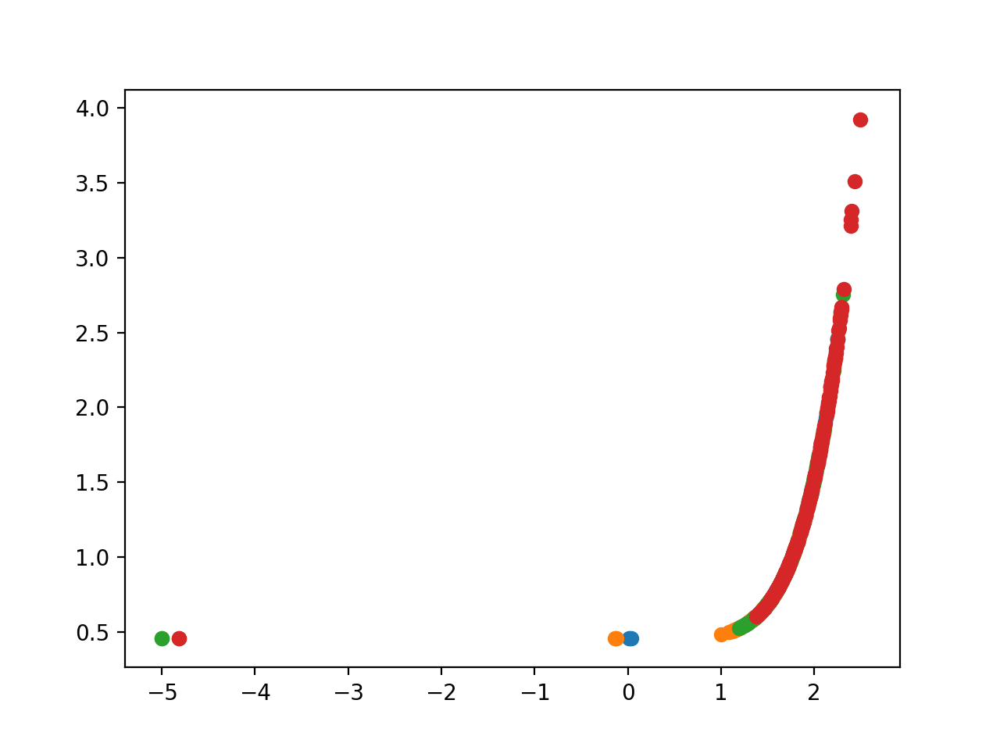

In [1203]:
plt.figure()
for ilight in range(2):
    plt.scatter(xvals_halo[:,:,:,ilight].flatten(),scall_halo_sim[:,:,:,ilight].flatten())
for ilight in range(2):
    plt.scatter(xvals_chrimson[:,:,:,ilight].flatten(),scall_chrimson_sim[:,:,:,ilight].flatten())
    

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


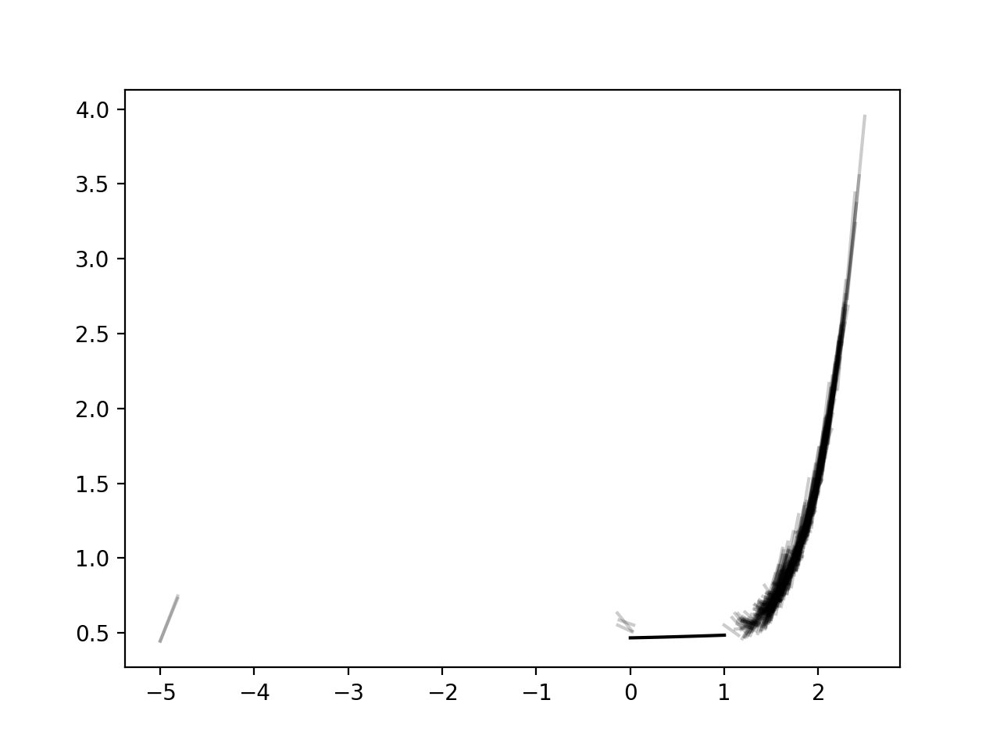

In [1204]:
plt.figure()
x_to_plot = xvals_halo.reshape((-1,2))
y_to_plot = np.nanmean(scall_halo,0).reshape((-1,2))
for iline in range(x_to_plot.shape[0]):
    plt.plot(x_to_plot[iline],y_to_plot[iline],c='k',alpha=0.2)
x_to_plot = xvals_chrimson.reshape((-1,2))
y_to_plot = np.nanmean(scall_chrimson,0).reshape((-1,2))
for iline in range(x_to_plot.shape[0]):
    plt.plot(x_to_plot[iline],y_to_plot[iline],c='k',alpha=0.2)
# for ilight in range(2):
#     plt.scatter(xvals_halo[:,:,:,ilight].flatten(),np.nanmean(scall_halo[:,:,:,:,ilight],0).flatten())
# for ilight in range(2):
#     plt.scatter(xvals_chrimson[:,:,:,ilight].flatten(),np.nanmean(scall_chrimson[:,:,:,:,ilight],0).flatten())
xplot = np.linspace(0,1,100)
plt.plot(xplot,f_mt(xplot,sigma2,offset,amplitude),c='k')


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


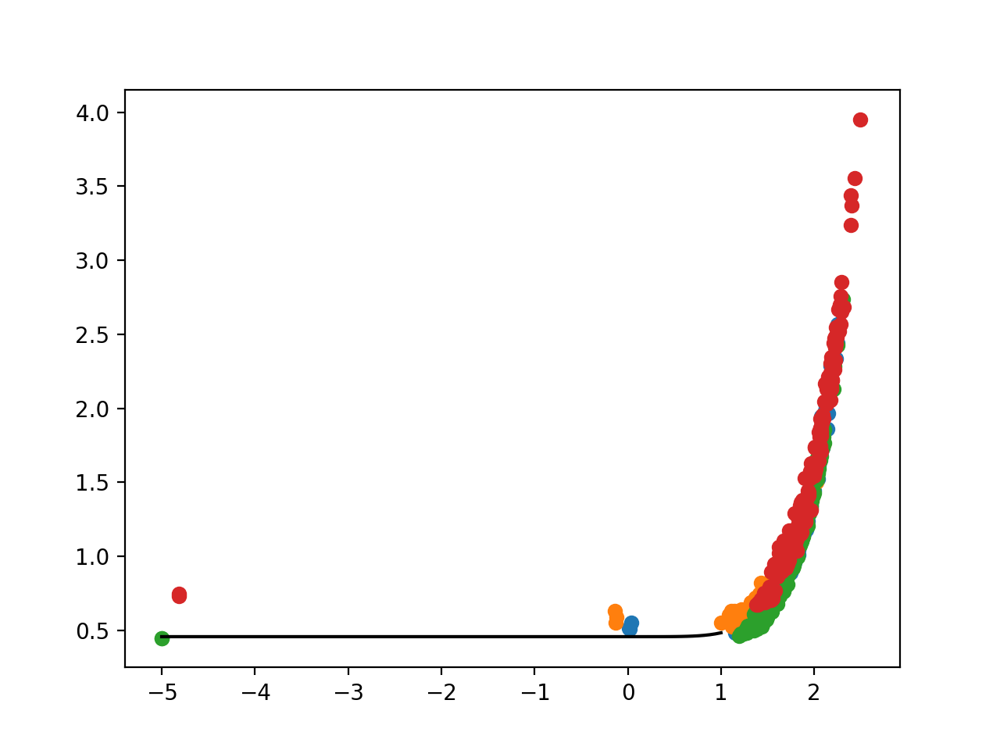

In [1205]:
plt.figure()
for ilight in range(2):
    plt.scatter(xvals_halo[:,:,:,ilight].flatten(),np.nanmean(scall_halo[:,:,:,:,ilight],0).flatten())
for ilight in range(2):
    plt.scatter(xvals_chrimson[:,:,:,ilight].flatten(),np.nanmean(scall_chrimson[:,:,:,:,ilight],0).flatten())
xplot = np.linspace(-5,1,100)
# plt.plot(xplot,f_mt(xplot,sigma2=sigma2,offset=offset,amplitude=amplitude),c='k')
plt.plot(xplot,f_power(xplot,n=n,offset=offset,amplitude=amplitude),c='k')


In [1210]:
from importlib import reload
reload(ut)
osi_halo = ut.compute_osi(scall_halo,np.arange(0,360,45))
osi_halo_sim = ut.compute_osi(scall_halo_sim,np.arange(0,360,45))


In [1106]:
scall_halo_sim.shape

(4, 6, 8, 2)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


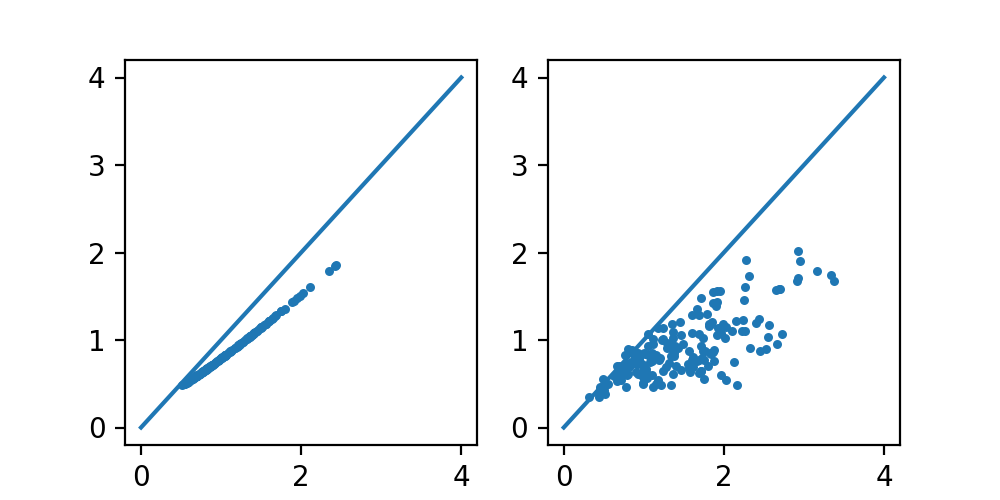

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


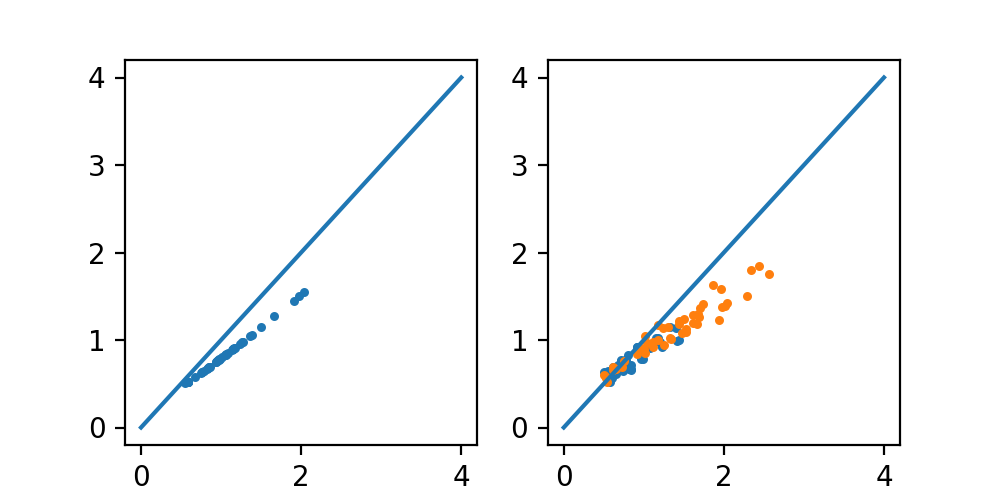

In [1094]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.scatter(scall_halo_sim[:,:,:,:,0].flatten(),scall_halo_sim[:,:,:,:,1].flatten(),s=5)
plt.plot((0,4),(0,4))
plt.subplot(1,2,2)
plt.scatter(scall_halo[:,:,:,:,0].flatten(),scall_halo[:,:,:,:,1].flatten(),s=5)
plt.plot((0,4),(0,4))

plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.scatter(np.nanmean(scall_halo_sim[:,:,:,:,0],0).flatten(),np.nanmean(scall_halo_sim[:,:,:,:,1],0).flatten(),s=5)
plt.plot((0,4),(0,4))
plt.subplot(1,2,2)
for angles in [[2,6],[0,4]]:
    plt.scatter(np.nanmean(scall_halo[:,:,:,angles,0],0).flatten(),np.nanmean(scall_halo[:,:,:,angles,1],0).flatten(),s=5)
plt.plot((0,4),(0,4))

In [1108]:
osi_halo_sim.shape

(4, 6, 2)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.11812071622080982
0.15806322880984425


<IPython.core.display.Javascript object>


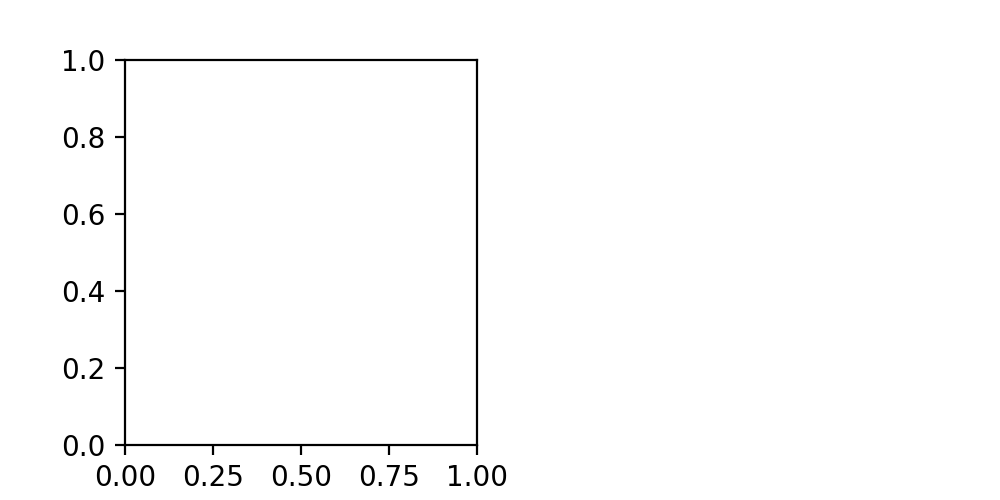

IndexError: too many indices for array

In [1208]:
colors = [np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))]
reload(ut)
for osi in [osi_halo,osi_halo_sim]:
    plt.figure(figsize=(5,2.5))
    usize = np.array((5,11,25,60))
    ucontrast = np.array((0,6,12,25,50,100))
    for iicontrast,icontrast in enumerate([1,5]):
        plt.subplot(1,2,iicontrast+1)
        ut.plot_bootstrapped_errorbars_hillel(usize,osi[:,:,icontrast,:].transpose((0,2,1)),colors=colors[iicontrast])
        plt.xlabel('size ($^o$)')
        plt.ylabel('OSI')
        plt.tight_layout()
        plt.ylim((0,0.3))
        plt.title('%d%% contrast'%ucontrast[icontrast])
        ut.erase_top_right()
        

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


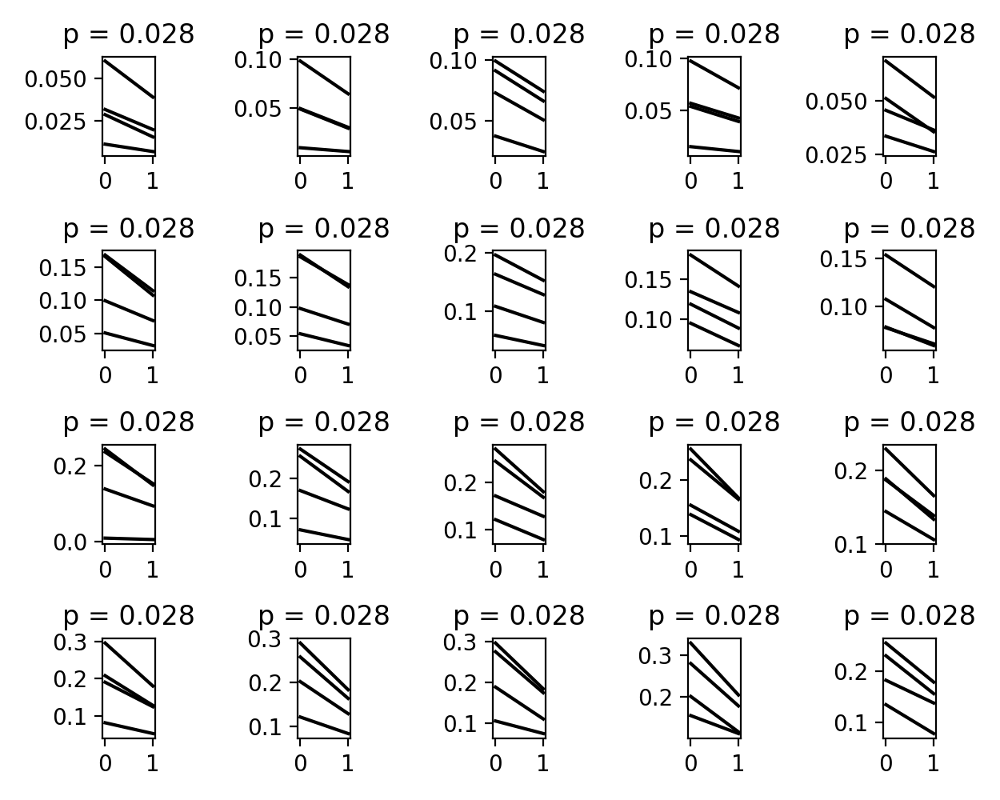

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/morestats.py:2879: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/morestats.py:2882: RuntimeWarning: invalid value encountered in greater
  r_plus = np.sum((d > 0) * r, axis=0)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/scipy/stats/morestats.py:2883: RuntimeWarning: invalid value encountered in less
  r_minus = np.sum((d < 0) * r, axis=0)


In [1047]:
nsize,ncontrast = 4,6
plt.figure(figsize=(6.25,5))
p = np.zeros((nsize,ncontrast))
for i in range(nsize):
    for j in range(1,ncontrast):
        plt.subplot(nsize,ncontrast-1,i*(ncontrast-1)+j)
        data = osi_halo_lin[:,i,j]
        plt.plot(data.T,c='k')
        _,p[i,j] = sst.wilcoxon(data[:,0],data[:,1])
        plt.title('p = %.03f'%p[i,j])
        plt.tight_layout()

In [719]:
# scall_halo_sim = scall_halo.copy()
# scall_halo_sim[:,:,:,:,1] = opto_transform(scall_halo[:,:,:,:,0],hs[1])

# scall_halo_sim = np.nanmean(scall_halo,0)
# scall_halo_sim[:,:,:,1] = opto_transform(np.nanmean(scall_halo[:,:,:,:,0],0),hs[1])


In [1136]:
hs

array([ 0.96622572, -0.54974088])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


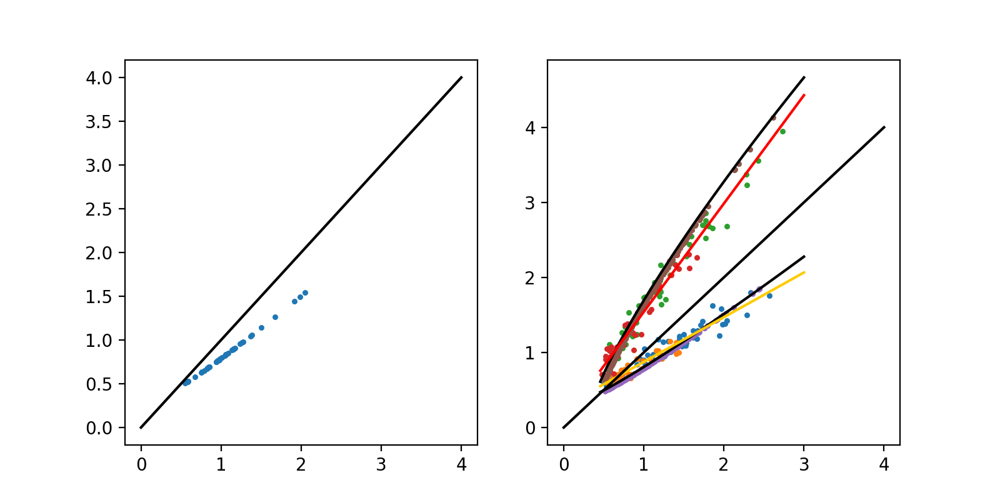

In [1139]:
# plt.figure(figsize=(5,2.5))
# plt.subplot(1,2,1)
# plt.scatter(scall_halo_sim[:,:,:,0].flatten(),scall_halo_sim[:,:,:,1].flatten(),s=5)
# plt.plot((0,4),(0,4))
# plt.subplot(1,2,2)
# plt.scatter(scall_halo[:,:,:,:,0].flatten(),scall_halo[:,:,:,:,1].flatten(),s=5)
# plt.plot((0,4),(0,4))

plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.scatter(np.nanmean(scall_halo_sim[:,:,:,0],0).flatten(),np.nanmean(scall_halo_sim[:,:,:,1],0).flatten(),s=5)
plt.plot((0,4),(0,4),c='k')
plt.subplot(1,2,2)
xdata_halo = np.zeros((0,))
ydata_halo = np.zeros((0,))
for angles in [[0,4],[2,6]]:
    xdata_halo = np.concatenate((xdata_halo,np.nanmean(scall_halo[:,:,:,angles,0],0).flatten()))
    ydata_halo = np.concatenate((ydata_halo,np.nanmean(scall_halo[:,:,:,angles,1],0).flatten()))
    plt.scatter(np.nanmean(scall_halo[:,:,:,angles,0],0).flatten(),np.nanmean(scall_halo[:,:,:,angles,1],0).flatten(),s=5)

xdata_chrimson = np.zeros((0,))
ydata_chrimson = np.zeros((0,))
for angles in [[0,4],[2,6]]:
    xdata_chrimson = np.concatenate((xdata_chrimson,np.nanmean(scall_chrimson[:,:,:,angles,0],0).flatten()))
    ydata_chrimson = np.concatenate((ydata_chrimson,np.nanmean(scall_chrimson[:,:,:,angles,1],0).flatten()))
    plt.scatter(np.nanmean(scall_chrimson[:,:,:,angles,0],0).flatten(),np.nanmean(scall_chrimson[:,:,:,angles,1],0).flatten(),s=5)
plt.plot(np.linspace(offset,3,100),opto_transform(np.linspace(0.5,3,100),hs[1]),c='k')
plt.plot(np.linspace(offset,3,100),opto_transform(np.linspace(0.5,3,100),hs[0]),c='k')

plt.scatter(scall_halo_sim[:,:,:,0].flatten(),scall_halo_sim[:,:,:,1].flatten(),s=5)
plt.scatter(scall_chrimson_sim[:,:,:,0].flatten(),scall_chrimson_sim[:,:,:,1].flatten(),s=5)

slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_chrimson, ydata_chrimson)
plt.plot(np.linspace(offset,3,100),slope*np.linspace(offset,3,100)+intercept,c='r')
slope, intercept, r_value, p_value, std_err = sst.linregress(xdata_halo, ydata_halo)
plt.plot(np.linspace(offset,3,100),slope*np.linspace(offset,3,100)+intercept,c=np.array((1,0.8,0)))

plt.plot((0,4),(0,4),c='k')

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


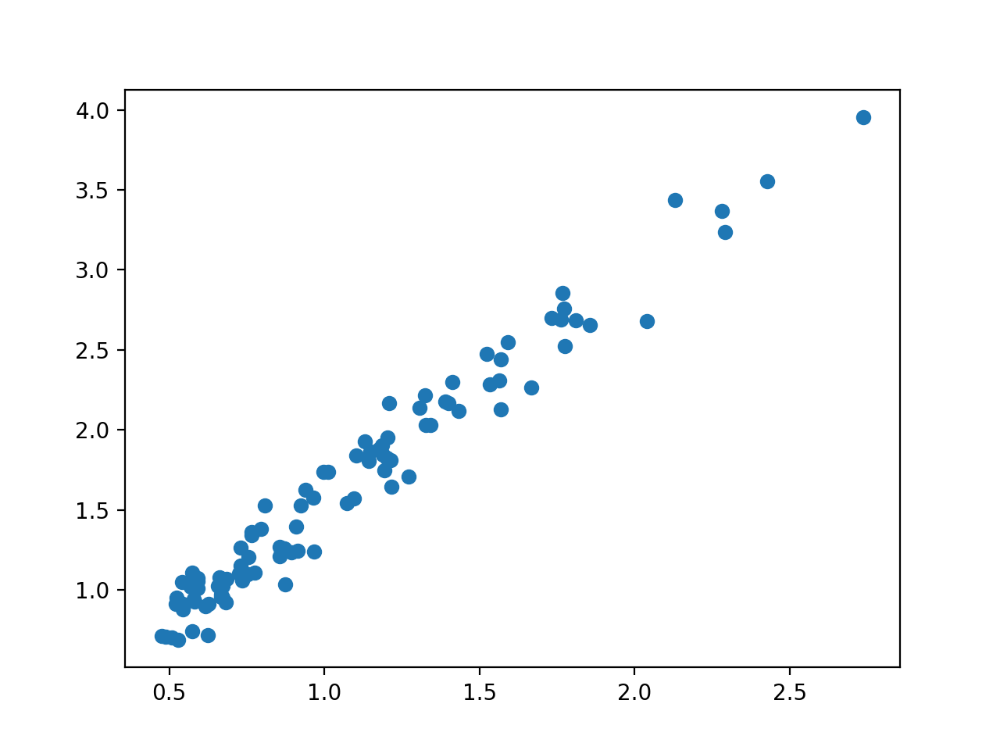

In [1222]:
plt.figure()
plt.scatter(xdata,ydata)
slope, intercept, r_value, p_value, std_err = sst.linregress(xdata, ydata)
xtemp = np.linspace(0.5,3,10)
# scall_halo_lin = np.nanmean(scall_halo,0)
# scall_halo_lin[:,:,:,1] = scall_halo_lin[:,:,:,0]*slope + intercept
scall_halo_lin = scall_halo.copy()
scall_halo_lin[:,:,:,:,1] = scall_halo_lin[:,:,:,:,0]*slope + intercept
# plt.scatter(scall_halo_lin[:,:,:,:,0].flatten(),scall_halo_lin[:,:,:,:,1].flatten())


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


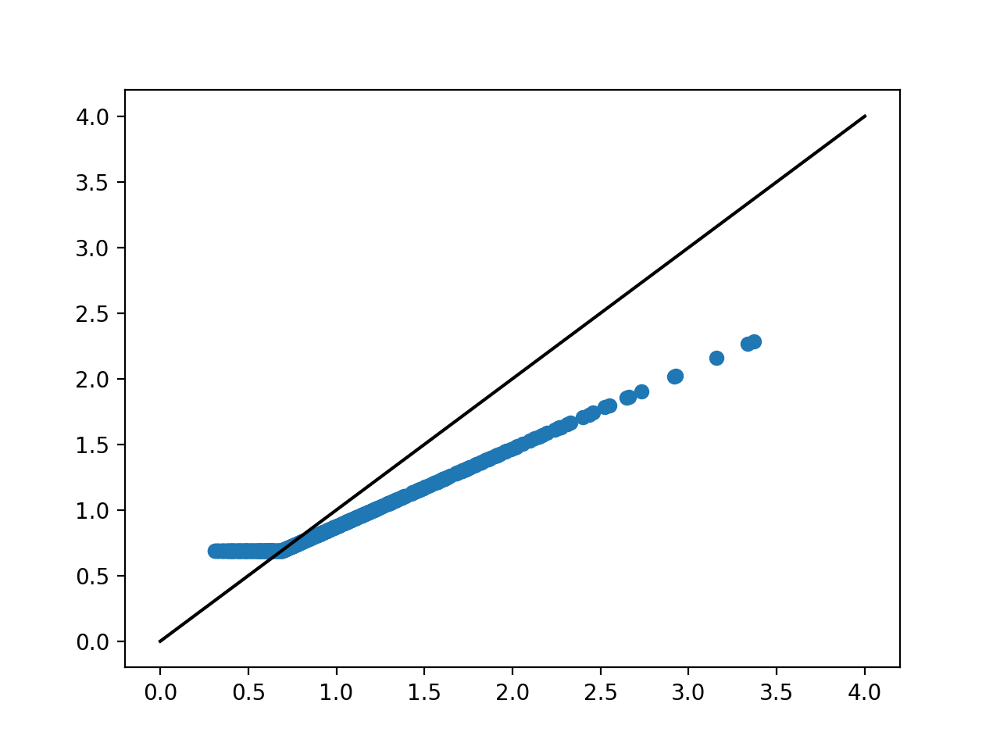

<IPython.core.display.Javascript object>


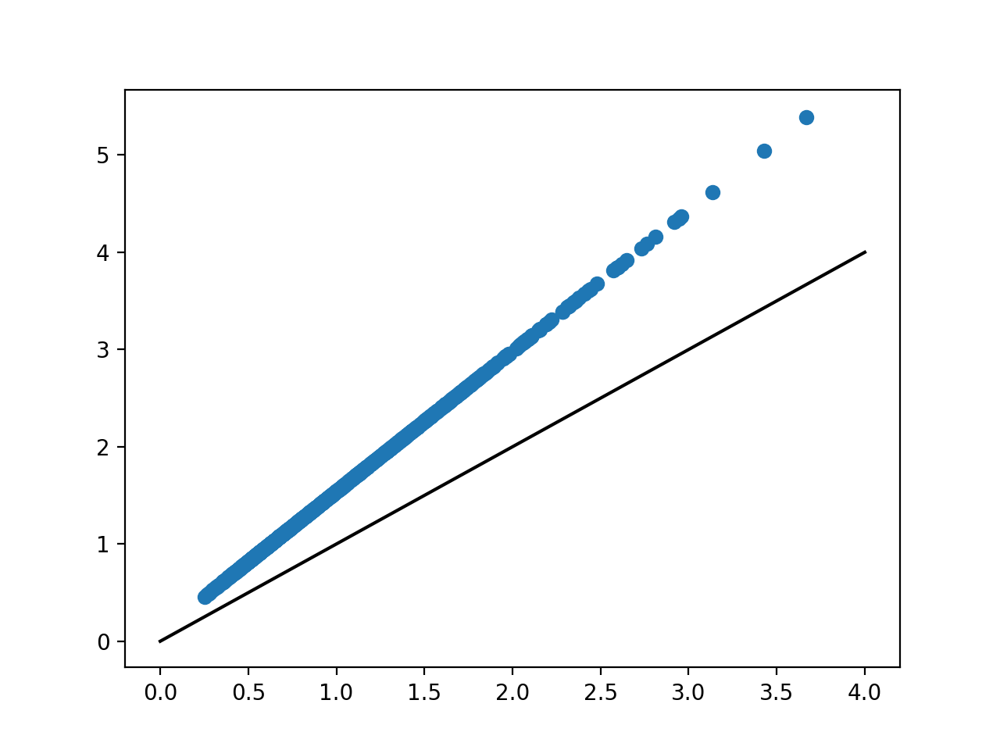

In [1227]:
scall_halo_lin,scall_chrimson_lin = [this_scall.copy() for this_scall in [scall_halo,scall_chrimson]]
idata = 0
mb = np.zeros((2,2))
for scall,xdata,ydata in zip([scall_halo_lin,scall_chrimson_lin],[xdata_halo,xdata_chrimson],[ydata_halo,ydata_chrimson]):
    slope, intercept, r_value, p_value, std_err = sst.linregress(xdata, ydata)
    alpha = slope
    x0 = intercept/(1-alpha)
#     scall[:,:,:,:,1] = x0 + alpha*(scall[:,:,:,:,0]-x0)
    scall[:,:,:,:,1] = np.maximum(x0 + alpha*(scall[:,:,:,:,0]-x0),x0)
    plt.figure()
    plt.scatter(scall[:,:,:,:,0].flatten(),scall[:,:,:,:,1].flatten())
    plt.plot((0,4),(0,4),c='k')
    mb[idata,0] = slope
    mb[idata,1] = intercept
    idata = idata+1

In [1220]:
mb
alphax0 = mb.copy()
for idata in range(2):
    alphax0[idata,1] = alphax0[idata,1]/(1-alphax0[idata,0])

In [1221]:
alphax0

array([[ 0.59550784,  0.6892368 ],
       [ 1.44305796, -0.22162779]])

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


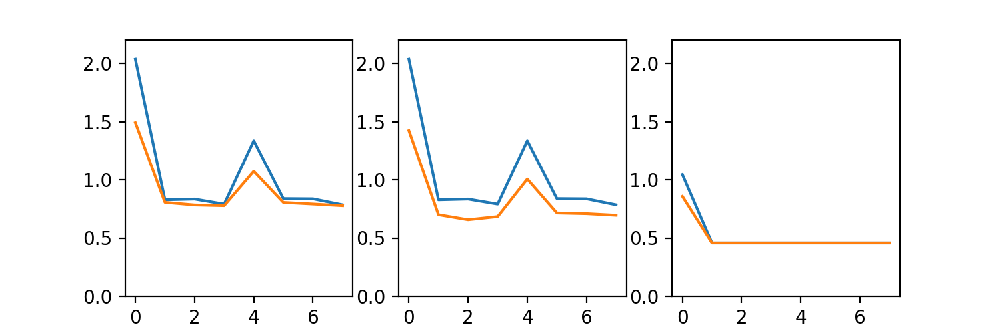

(0, 2.2)

In [1228]:
ylim = (0,2.2)
plt.figure(figsize=(7.5,2.5))
plt.subplot(1,3,1)
plt.plot(np.nanmean(scall_halo_lin[:,3,5,:,:],0))
plt.ylim(ylim)
plt.subplot(1,3,2)
plt.plot(np.nanmean(scall_halo[:,3,5,:,:],0))
plt.ylim(ylim)
plt.subplot(1,3,3)
plt.plot(np.nanmean(scall_halo_sim[:,3,5,:,:],0))
plt.ylim(ylim)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


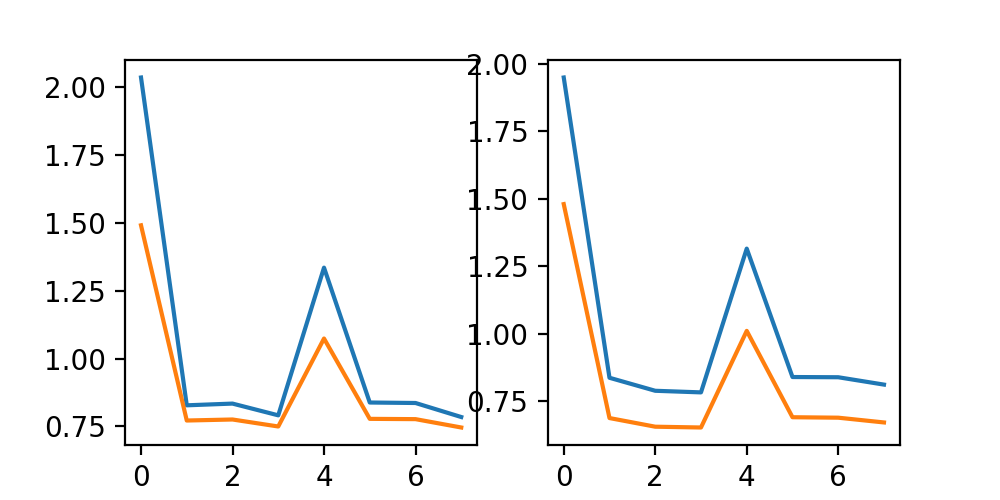

In [1159]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.plot(np.nanmean(scall_halo_lin[:,3,5,:,:],0))
plt.subplot(1,2,2)
plt.plot(np.nanmean(scall_halo_sim[:,3,5,:,:],0))

In [1160]:
from importlib import reload
reload(ut)
# osi_halo = ut.compute_osi(scall_halo,np.arange(0,360,45))
# osi_halo_sim = ut.compute_osi(scall_halo_sim,np.arange(0,360,45))
# osi_halo_lin = ut.compute_osi(scall_halo_lin,np.arange(0,360,45))
scalls = [scall_halo,scall_halo_sim,scall_halo_lin,scall_chrimson,scall_chrimson_sim,scall_chrimson_lin]
osis = [ut.compute_osi(scall,np.arange(0,360,45)) for scall in scalls]
[osi_halo,osi_halo_sim,osi_halo_lin,osi_chrimson,osi_chrimson_sim,osi_chrimson_lin] = osis
smis = [np.nanmean(scall,3)[:,-1]/np.max(np.nanmean(scall,3),1) for scall in scalls]
[smi_halo,smi_halo_sim,smi_halo_lin,smi_chrimson,smi_chrimson_sim,smi_chrimson_lin] = smis


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


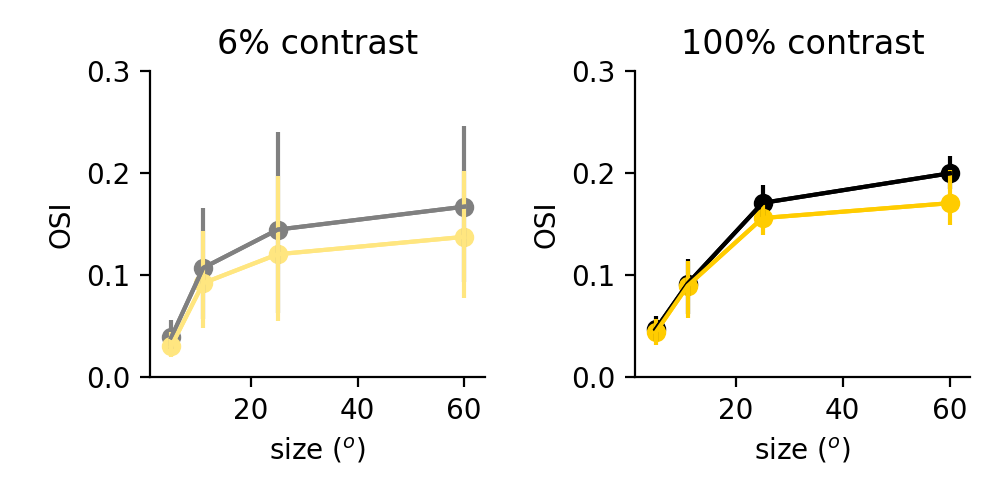

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.08825550285568422
0.18312219055429546


<IPython.core.display.Javascript object>


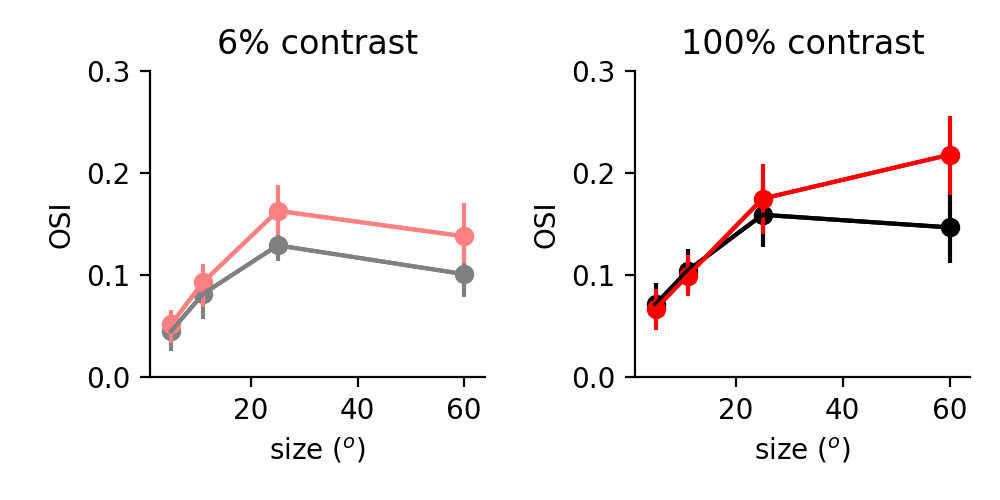

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.13811807184607428
0.17993316600021672


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


In [1161]:
# colors = [np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))]
colorses = [[np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))],[np.array(((0.5,0.5,0.5),(1,0.5,0.5))),np.array(((0,0,0),(1,0,0)))]]
reload(ut)
# osi = osi_halo_sim
filenames = ['figures/osi_linear_pred_halo.eps','figures/osi_linear_pred_chrimson.eps']
osis = [osi_halo_sim,osi_chrimson_sim]
for osi,filename,colors in zip(osis,filenames,colorses):
    plt.figure(figsize=(5,2.5))
    usize = np.array((5,11,25,60))
    ucontrast = np.array((0,6,12,25,50,100))
    for iicontrast,icontrast in enumerate([1,5]):
        plt.subplot(1,2,iicontrast+1)
    #     ut.plot_bootstrapped_errorbars_hillel(usize,osi[np.newaxis,:,icontrast,:].transpose((0,2,1)),colors=colors[iicontrast])
        ut.plot_bootstrapped_errorbars_hillel(usize,osi[:,:,icontrast,:].transpose((0,2,1)),colors=colors[iicontrast])
        plt.xlabel('size ($^o$)')
        plt.ylabel('OSI')
        plt.tight_layout()
        plt.ylim((0,0.3))
        plt.title('%d%% contrast'%ucontrast[icontrast])
        ut.erase_top_right()
#     plt.savefig(filename)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


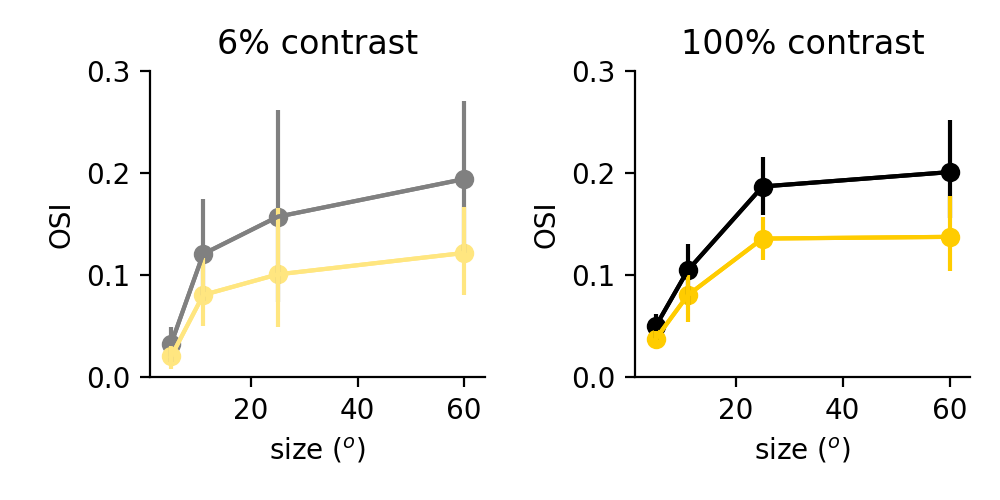

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.11812071622080982
0.15806322880984425


<IPython.core.display.Javascript object>


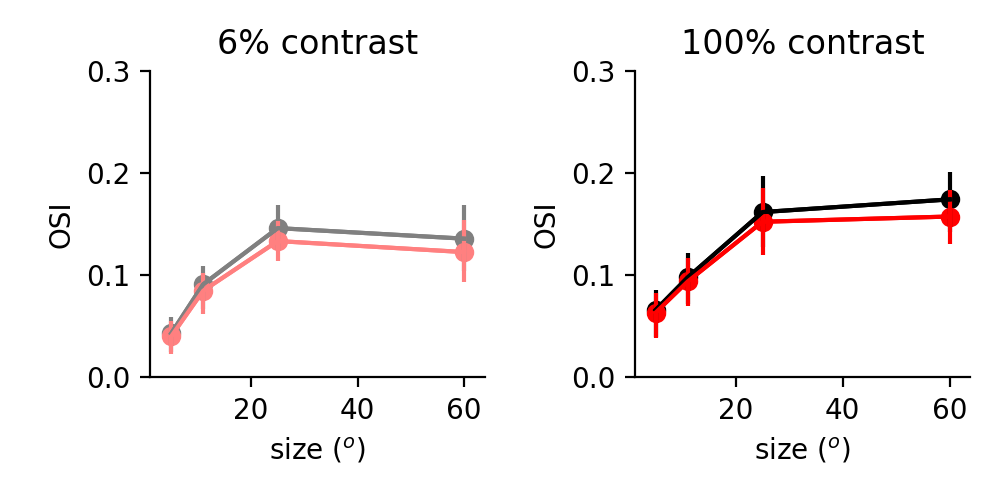

0.12353486352628382


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

0.1471501965516236


In [1229]:
# colors = [np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))]
colorses = [[np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))],[np.array(((0.5,0.5,0.5),(1,0.5,0.5))),np.array(((0,0,0),(1,0,0)))]]
reload(ut)
# osi = osi_halo_sim
filenames = ['figures/osi_linear_pred_halo.eps','figures/osi_linear_pred_chrimson.eps']
osis = [osi_halo_lin,osi_chrimson_lin]
for osi,filename,colors in zip(osis,filenames,colorses):
    plt.figure(figsize=(5,2.5))
    usize = np.array((5,11,25,60))
    ucontrast = np.array((0,6,12,25,50,100))
    for iicontrast,icontrast in enumerate([1,5]):
        plt.subplot(1,2,iicontrast+1)
    #     ut.plot_bootstrapped_errorbars_hillel(usize,osi[np.newaxis,:,icontrast,:].transpose((0,2,1)),colors=colors[iicontrast])
        ut.plot_bootstrapped_errorbars_hillel(usize,osi[:,:,icontrast,:].transpose((0,2,1)),colors=colors[iicontrast])
        plt.xlabel('size ($^o$)')
        plt.ylabel('OSI')
        plt.tight_layout()
        plt.ylim((0,0.3))
        plt.title('%d%% contrast'%ucontrast[icontrast])
        ut.erase_top_right()
#     plt.savefig(filename)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


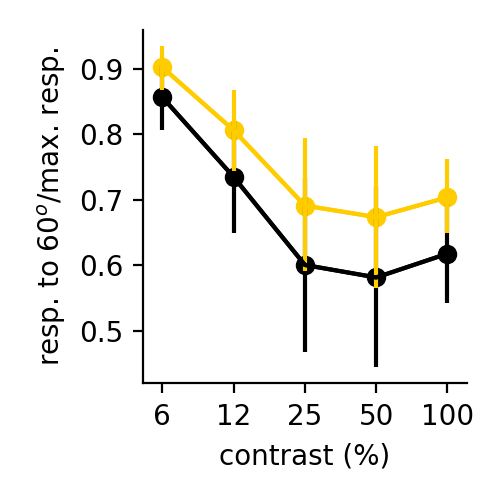

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.8703175687132813


<IPython.core.display.Javascript object>


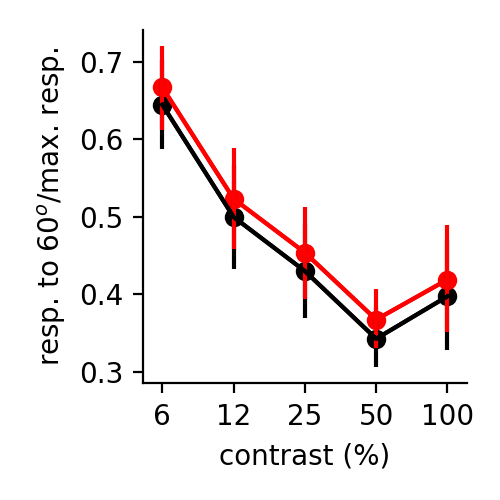

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


0.6135404263369839


In [1142]:
# colors = [np.array(((0.5,0.5,0.5),(1,0.9,0.5))),np.array(((0,0,0),(1,0.8,0)))]
colorses = [np.array(((0,0,0),(1,0.8,0))),np.array(((0,0,0),(1,0,0)))]
reload(ut)
# osi = osi_halo_sim
filenames = ['figures/smi_linear_pred_halo.eps','figures/smi_linear_pred_chrimson.eps']
smis = [smi_halo_lin,smi_chrimson_lin]
for smi,filename,colors in zip(smis,filenames,colorses):
    plt.figure(figsize=(2.5,2.5))
    ucontrast = [0,6,12,25,50,100]
    ut.plot_bootstrapped_errorbars_hillel(np.arange(1,6),smi[:,1:].transpose((0,2,1)),pct=(16,84),colors=colors)
    plt.xticks(np.arange(1,6),ucontrast[1:])
    # for icontrast in range(1,smi.shape[1]):
    #     _,p = sst.wilcoxon(smi[:,icontrast,0],smi[:,icontrast,1])
    #     plt.text(ucontrast[icontrast],0.8,'%.2f'%p)
    plt.xlabel('contrast (%)')
    plt.ylabel('resp. to 60$^o$/max. resp.')
    # plt.legend(['light off','light on'])
    plt.tight_layout()
    ut.erase_top_right()
#     plt.savefig(filename)
    

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


<IPython.core.display.Javascript object>


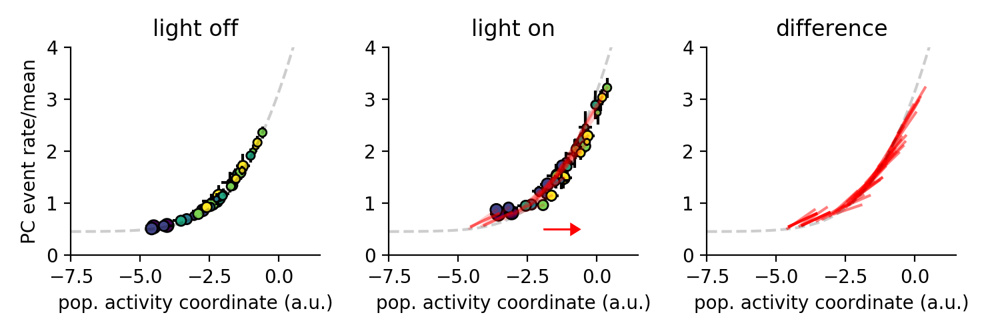

<IPython.core.display.Javascript object>


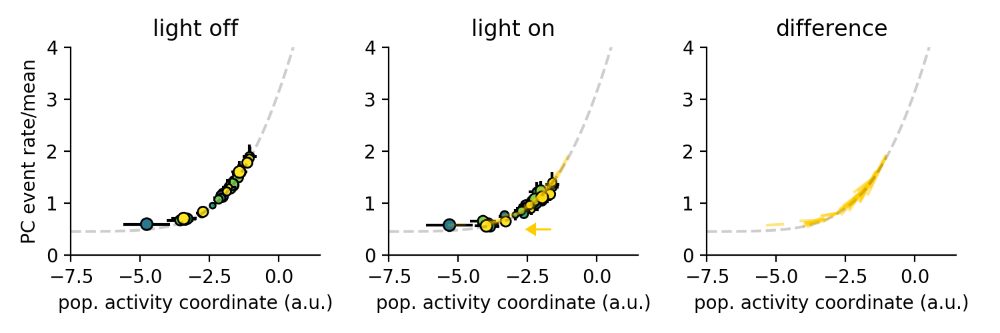

In [1144]:
sigma2 = sigma2
offset = offset
amplitude = amplitude
hvals = [[hs[0],hs[0]],[hs[1],hs[1]]]

datas = [[YY_chrimson_orig,YY_chrimson_orth],[YY_halo_orig,YY_halo_orth]]
files = ['figures/vip_chrimson_effect_from_nonlinearity.jpg','figures/vip_halo_effect_from_nonlinearity.jpg']
xbds = np.array((-7.5,1.5))
# colors = ['k','k']
colors = [np.array((1,0,0)),np.array((1,0.8,0))]
alpha = [None,0.2,0.5]
for idata in range(2):
    plt.figure(figsize=(7.5,2.5))
    for ipanel in range(3):
        plt.subplot(1,3,ipanel+1)
        iangle = 0
        for data,h in zip(datas[idata],hvals[idata]):
            this_data = data.copy()
            this_data[:,:,0] = np.nanmean(this_data[:,:,0],1)[:,np.newaxis]
            xval = invert_f_mt(this_data[:,:,:,0],sigma2=sigma2,offset=offset,amplitude=amplitude)
            if ipanel==0:
                sca.scatter_size_contrast_errorbar(xval,this_data[:,:,:,0],equality_line=False,equate_0=True,colormap=plt.cm.viridis)#plt.cm.gray_r)
                plt.ylabel('PC event rate/mean')
                plt.title('light off')
            if ipanel==1:
                sca.scatter_size_contrast_errorbar(xval+h,this_data[:,:,:,1],equality_line=False,equate_0=True,colormap=plt.cm.viridis)#plt.cm.gray_r)
                plt.title('light on')
                if iangle==0:
                    base = np.nanmedian(xval)
                    plt.arrow(base,0.5,h,0,color=colors[idata],head_width=0.2)
            if ipanel==1 or ipanel==2:
                mean_data = np.nanmean(this_data,0).reshape((-1,2))
                xflat = np.nanmean(xval,0).flatten()[:,np.newaxis]
                mean_xval = np.concatenate((xflat,xflat+h*np.ones_like(xflat)),axis=1)
                for iline in range(mean_data.shape[0]):
                    plt.plot(mean_xval[iline,:],mean_data[iline,:],c=colors[idata],alpha=alpha[ipanel])
            if ipanel==2:
                plt.title('difference')
            xplot = np.linspace(*xbds,100)
            plt.plot(xplot,f_mt(xplot,sigma2=sigma2,offset=offset,amplitude=amplitude),c='k',linestyle='dashed',alpha=0.1)
            plt.xlim(xbds)
            plt.ylim((0,4))
            plt.xlabel('pop. activity coordinate (a.u.)')
            iangle = iangle+1
            ut.erase_top_right()
    plt.tight_layout()
#     plt.savefig(files[idata],dpi=300)


In [ ]:
sigma2 = sigma2
offset = offset
amplitude = amplitude
hvals = [[hs[0],hs[0]],[hs[1],hs[1]]]

datas = [[YY_chrimson_orig,YY_chrimson_orth],[YY_halo_orig,YY_halo_orth]]
files = ['figures/vip_chrimson_effect_from_nonlinearity.jpg','figures/vip_halo_effect_from_nonlinearity.jpg']
xbds = np.array((-5,3.5))
# colors = ['k','k']
colors = [np.array((1,0,0)),np.array((1,0.8,0))]
alpha = [None,0.2,0.5]
for idata in range(2):
    plt.figure(figsize=(7.5,2.5))
    for ipanel in range(3):
        plt.subplot(1,3,ipanel+1)
        iangle = 0
        for data,h in zip(datas[idata],hvals[idata]):
            this_data = data.copy()
            this_data[:,:,0] = np.nanmean(this_data[:,:,0],1)[:,np.newaxis]
            xval = invert_f_mt(this_data[:,:,:,0],sigma2=sigma2,offset=offset,amplitude=amplitude)
            if ipanel==0:
                sca.scatter_size_contrast_errorbar(xval,this_data[:,:,:,0],equality_line=False,equate_0=True,colormap=plt.cm.viridis)#plt.cm.gray_r)
                plt.ylabel('PC event rate/mean')
                plt.title('light off')
            if ipanel==1:
                sca.scatter_size_contrast_errorbar(xval+h,this_data[:,:,:,1],equality_line=False,equate_0=True,colormap=plt.cm.viridis)#plt.cm.gray_r)
                plt.title('light on')
                if iangle==0:
                    base = np.nanmedian(xval)
                    plt.arrow(base,0.5,h,0,color=colors[idata],head_width=0.2)
            if ipanel==1 or ipanel==2:
                mean_data = np.nanmean(this_data,0).reshape((-1,2))
                xflat = np.nanmean(xval,0).flatten()[:,np.newaxis]
                mean_xval = np.concatenate((xflat,xflat+h*np.ones_like(xflat)),axis=1)
                for iline in range(mean_data.shape[0]):
                    plt.plot(mean_xval[iline,:],mean_data[iline,:],c=colors[idata],alpha=alpha[ipanel])
            if ipanel==2:
                plt.title('difference')
            xplot = np.linspace(*xbds,100)
            plt.plot(xplot,f_mt(xplot,sigma2=sigma2,offset=offset,amplitude=amplitude),c='k',linestyle='dashed',alpha=0.1)
            plt.xlim(xbds)
            plt.ylim((0,4))
            plt.xlabel('pop. activity coordinate (a.u.)')
            iangle = iangle+1
            ut.erase_top_right()
    plt.tight_layout()
#     plt.savefig(files[idata],dpi=300)

In [582]:
datas = [[YY_chrimson_orig,YY_chrimson_orth],[YY_halo_orig,YY_halo_orth]]

In [583]:
nopto = len(datas)
added_data = [None for iopto in range(nopto)]
for iopto in range(nopto):
    nangle = len(datas[iopto])
    added_data[iopto] = [None for iangle in range(nangle)]
    for iangle in range(nangle):
        this_data = datas[iopto][iangle][:,:,1:,:]
        shp = this_data.shape
        added_data[iopto][iangle] = this_data.reshape((shp[0],-1,shp[3]))
    added_data[iopto] = np.concatenate(added_data[iopto],axis=1)


In [584]:
lkat = [np.isnan(ad).sum(1).sum(1)==0 for ad in added_data]
ranks = [np.argsort(ad[lk],axis=1) for ad,lk in zip(added_data,lkat)]
ranks_total = [np.argsort(np.nanmean(ad[lk],0),axis=0) for ad,lk in zip(added_data,lkat)]

In [585]:
iopto = 1
cc = [None for iopto in range(nopto)]
for iopto in range(nopto):
    nexpt = ranks[iopto].shape[0]
    cc[iopto] = np.zeros((nexpt,))
    for iexpt in range(nexpt):
        cc[iopto][iexpt] = np.corrcoef(ranks[iopto][iexpt,:,0],ranks[iopto][iexpt,:,1])[0,1]
cc_total = [None for iopto in range(nopto)]
for iopto in range(nopto):
    cc_total[iopto] = np.corrcoef(ranks_total[iopto][:,0],ranks_total[iopto][:,1])[0,1]

In [586]:
cc_total

[0.5225140712945592, 0.6609756097560976]

In [587]:
np.mean(cc[1])

0.41515009380863044

<IPython.core.display.Javascript object>


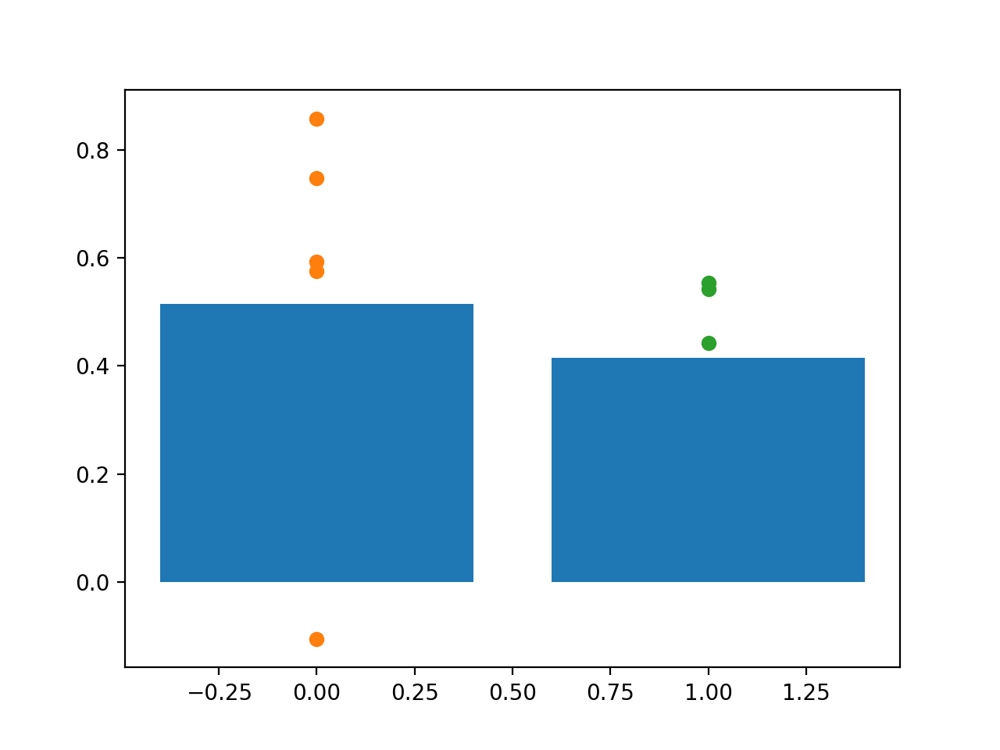

In [588]:
plt.figure()
plt.bar((0,1),(np.mean(cc[0]),np.mean(cc[1])))
for iopto in range(2):
    plt.scatter(iopto*np.ones_like(cc[iopto]),cc[iopto])

<IPython.core.display.Javascript object>


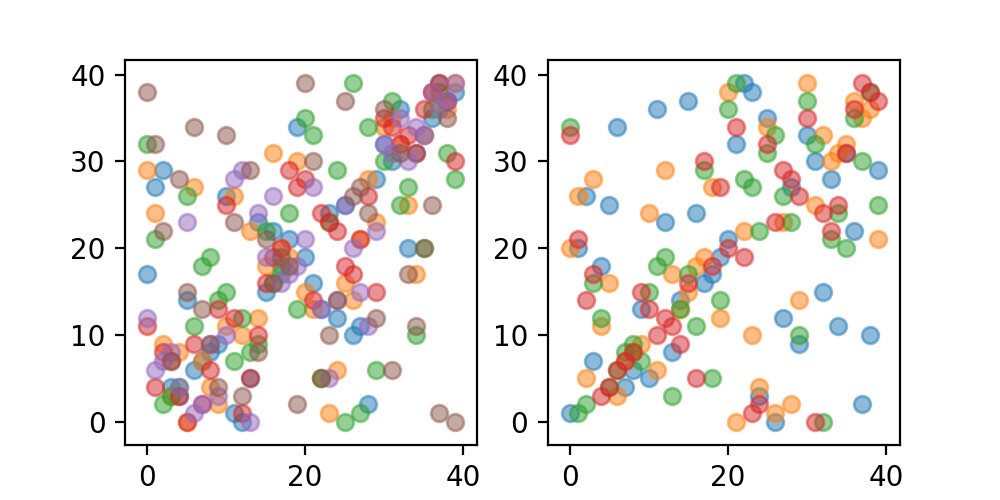

In [589]:
plt.figure(figsize=(5,2.5))
for iopto in range(nopto):
    plt.subplot(1,nopto,iopto+1)
    for iexpt in range(ranks[iopto].shape[0]):
        plt.scatter(ranks[iopto][iexpt,:,0],ranks[iopto][iexpt,:,1],alpha=0.5)

<IPython.core.display.Javascript object>


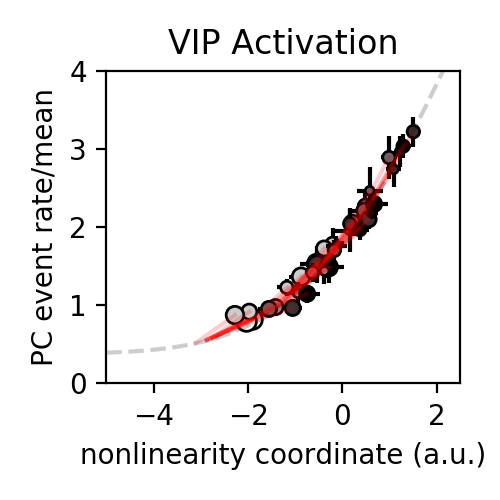

<IPython.core.display.Javascript object>


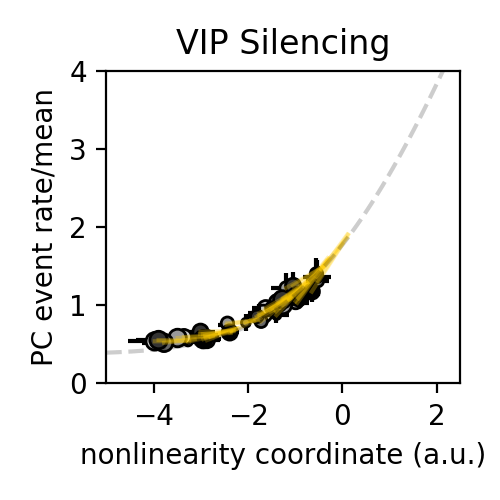

In [590]:
sigma2 = sigma2
offset = offset
amplitude = amplitude
hvals = [[hs[0],hs[0]],[hs[1],hs[1]]]

datas = [[YY_chrimson_orig,YY_chrimson_orth],[YY_halo_orig,YY_halo_orth]]
files = ['figures/vip_chrimson_effect_from_nonlinearity_one_plot.jpg','figures/vip_halo_effect_from_nonlinearity_one_plot.jpg']
xbds = np.array((-5,2.5))
# colors = ['k','k']
colors = [np.array((1,0,0)),np.array((1,0.8,0))]
alphas = [0.2,0.3]
titles = ['VIP Activation','VIP Silencing']
deviation = [None,None]
for idata in range(2):
    deviation[idata] = [None,None]
    plt.figure(figsize=(2.5,2.5))
    iangle = 0
    for data,h in zip(datas[idata],hvals[idata]):
        this_data = data.copy()
        this_data[:,:,0] = np.nanmean(this_data[:,:,0],1)[:,np.newaxis]
        xval = invert_f_mt(this_data[:,:,:,0],sigma2=sigma2,offset=offset,amplitude=amplitude)
        plt.ylabel('PC event rate/mean')
        sca.scatter_size_contrast_errorbar(xval+h,this_data[:,:,:,1],equality_line=False,equate_0=True,colormap=plt.cm.gray_r)
#         plt.title('light on')
        mean_data = np.nanmean(this_data,0).reshape((-1,2))
        xflat = np.nanmean(xval,0).flatten()[:,np.newaxis]
        mean_xval = np.concatenate((xflat,xflat+h*np.ones_like(xflat)),axis=1)
        deviation[idata][iangle] = mean_data - f_mt(mean_xval,sigma2=sigma2,offset=offset,amplitude=amplitude)
#         mean_xval[0::6] = np.mean(mean_xval[0::6],0)
#         this_mean_data
        for iline in range(mean_data.shape[0]):
            plt.plot(mean_xval[iline,:],mean_data[iline,:],c=colors[idata],alpha=alphas[idata],zorder=1)
#         plt.title('difference')
        xplot = np.linspace(*xbds,100)
        plt.plot(xplot,f_mt(xplot,sigma2=sigma2,offset=offset,amplitude=amplitude),c='k',linestyle='dashed',alpha=0.1)
        plt.xlim(xbds)
        plt.ylim((0,4))
        plt.xlabel('nonlinearity coordinate (a.u.)')
        plt.title(titles[idata])
        iangle = iangle+1
    plt.tight_layout()
    plt.savefig(files[idata],dpi=300)

<IPython.core.display.Javascript object>


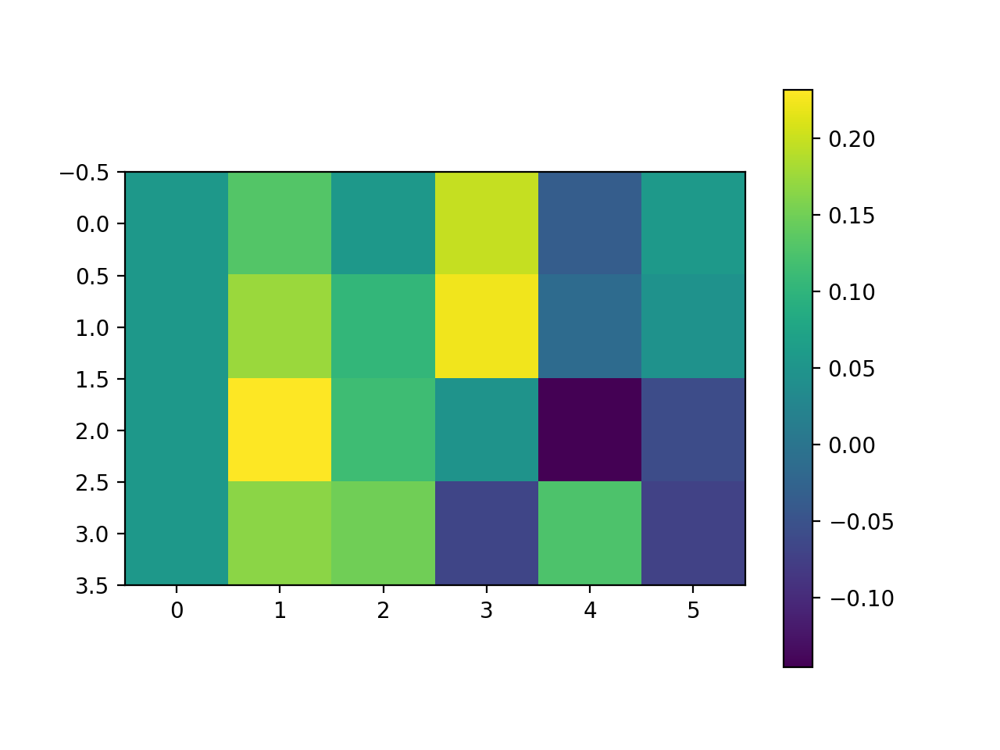

In [504]:
plt.figure()
plt.imshow(deviation[0][0][:,1].reshape((4,6)))
plt.colorbar()

In [489]:
offset

0.3770701959818846

In [432]:
cc

(24, 2)

<IPython.core.display.Javascript object>


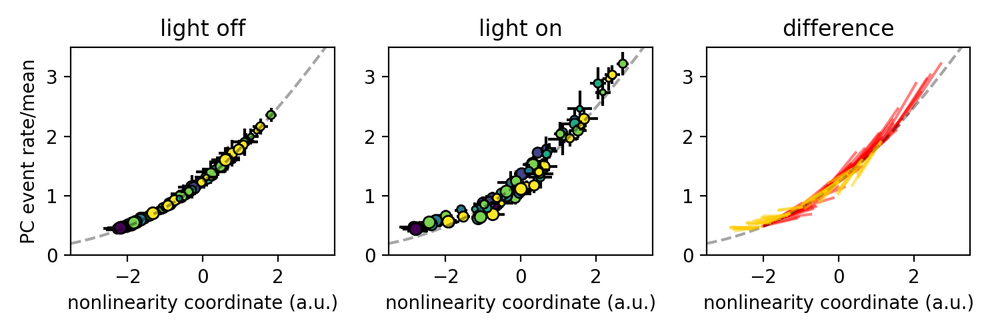

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  


In [369]:
sigma2 = sigma2star
offset = 0

datas = [[YY_chrimson_orig,YY_chrimson_orth],[YY_halo_orig,YY_halo_orth]]
files = ['figures/vip_chrimson_effect_from_nonlinearity.jpg','figures/vip_halo_effect_from_nonlinearity.jpg']
hs = [[0.9,0.9],[-0.6,-0.6]]
colors = [np.array((1,0,0)),np.array((1,0.8,0))]
xbds = np.array((-3.5,3.5))
plt.figure(figsize=(7.5,2.5))
predicted = [None for idata in range(2)]
for idata in range(2):
    predicted[idata] = [None for iangle in range(2)]
    for ipanel in range(3):
        plt.subplot(1,3,ipanel+1)
        for data,h,iangle in zip(datas[idata],hs[idata],np.arange(2)):
            xval = invert_f_mt(data[:,:,:,0],sigma2=sigma2,offset=offset)
            if ipanel==0:
                sca.scatter_size_contrast_errorbar(xval,data[:,:,:,0],equality_line=False)
                plt.ylabel('PC event rate/mean')
                plt.title('light off')
            if ipanel==1:
                sca.scatter_size_contrast_errorbar(xval+h,data[:,:,:,1],equality_line=False)
                plt.title('light on')
            if ipanel==2:
                mean_data = np.nanmean(data,0).reshape((-1,2))
                xflat = np.nanmean(xval,0).flatten()[:,np.newaxis]
                mean_xval = np.concatenate((xflat,xflat+h*np.ones_like(xflat)),axis=1)
                predicted[idata][iangle] = f_mt(mean_xval,sigma2=sigma2,offset=offset)
                for iline in range(mean_data.shape[0]):
                    plt.plot(mean_xval[iline,:],mean_data[iline,:],c=colors[idata],alpha=0.5)
                plt.title('difference')
            xplot = np.linspace(*xbds,100)
            plt.plot(xplot,f_mt(xplot,sigma2=sigma2,offset=offset),c='k',linestyle='dashed',alpha=0.1)
            plt.xlim(xbds)
            plt.ylim((0,3.5))
            plt.xlabel('nonlinearity coordinate (a.u.)')
    plt.tight_layout()
#     plt.savefig(files[idata],dpi=300)

<IPython.core.display.Javascript object>


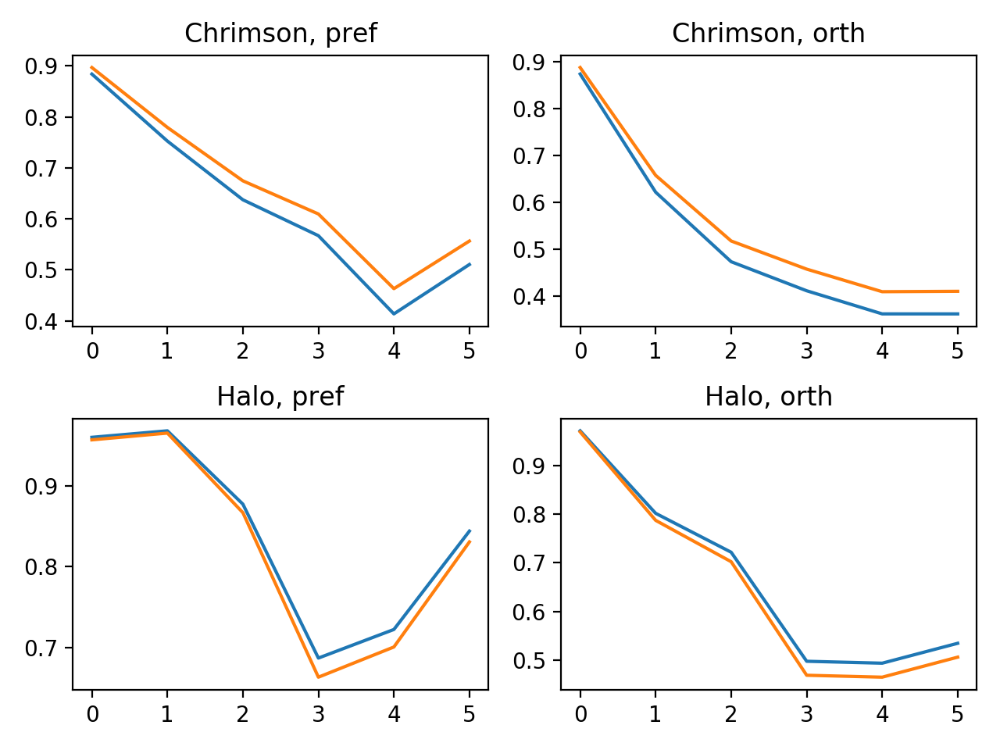

In [345]:
lbls = ['Chrimson','Halo']
angles = ['pref','orth']
plt.figure()
for idata in range(2):
    for iangle in range(2):
        plt.subplot(2,2,2*idata+iangle+1)
        data = predicted[idata][iangle].reshape((4,6,2))
        smi = data[-1]/np.max(data,0)
        plt.plot(smi)
        plt.title('%s, %s'%(lbls[idata],angles[iangle]))
plt.tight_layout()

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


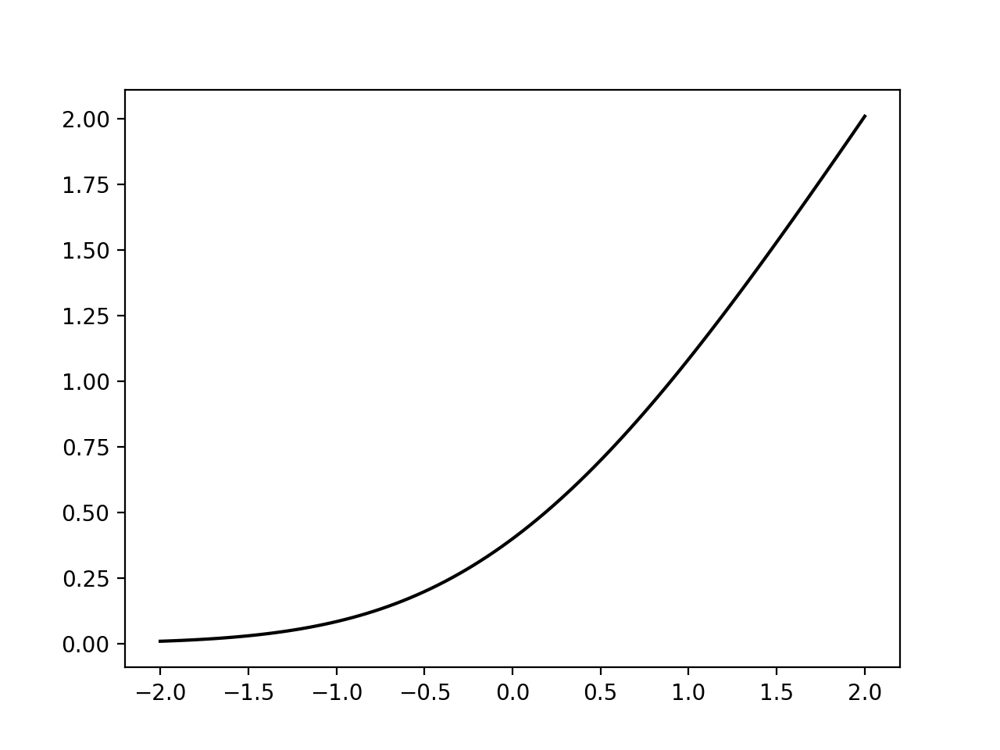

In [1232]:
plt.figure()
xx = np.linspace(-2,2,100)
plt.plot(xx,f_mt(xx,1),c='k')
plt.savefig('figures/f_mt.eps')

<IPython.core.display.Javascript object>


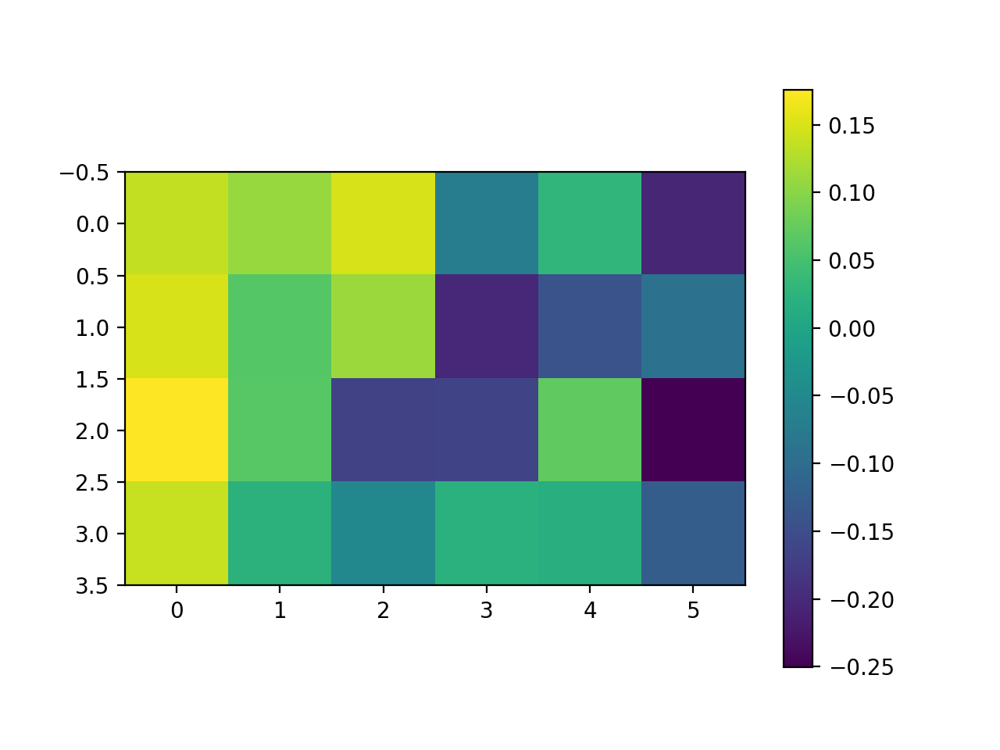

In [318]:
plt.figure()
plt.imshow(to_examine[:,1].reshape((4,6)))
plt.colorbar()

<IPython.core.display.Javascript object>


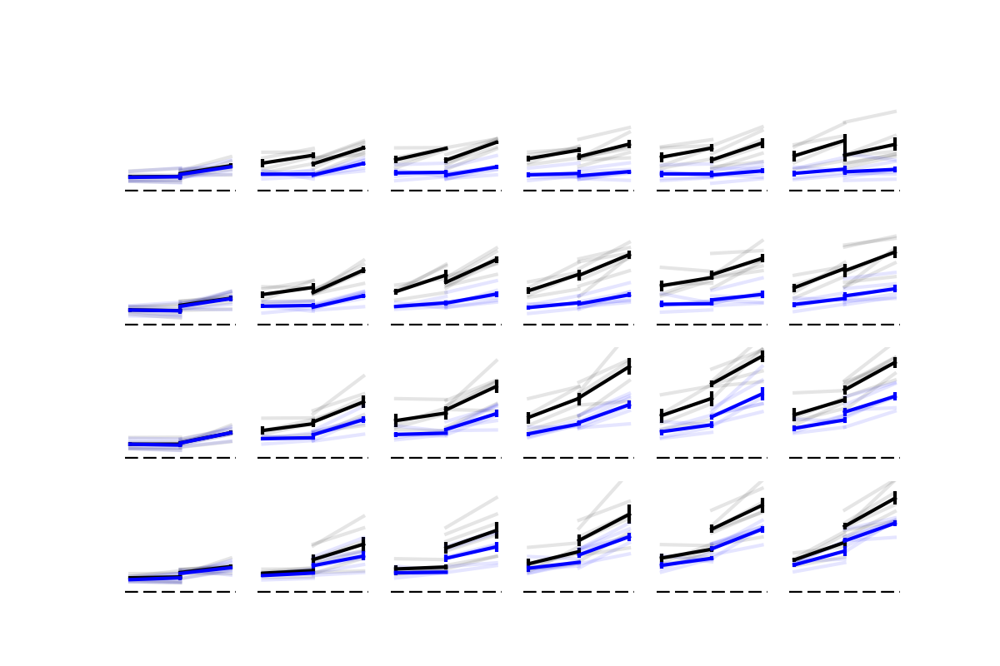

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


In [310]:
alpha = 0.1
nsize,ncontrast = YY_chrimson_orig.shape[1:3]
plt.figure(figsize=(ncontrast,nsize))
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,ncontrast*(nsize-1-i)+j+1)
        data = YY_chrimson_orig[:,i,j]
        plot_bars_and_lines((0,1),data,alpha=alpha)
        data = YY_halo_orig[:,i,j]
        plot_bars_and_lines((0,-1),data,alpha=alpha)
        plt.axis('off')
        plt.ylim((0,3.5))
        plt.axhline(0,linestyle='dashed',c='k')
        
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,ncontrast*(nsize-1-i)+j+1)
        data = YY_chrimson_orth[:,i,j]
        plot_bars_and_lines((0,1),data,alpha=alpha,c='b')
        data = YY_halo_orth[:,i,j]
        plot_bars_and_lines((0,-1),data,alpha=alpha,c='b')
        plt.axis('off')
        plt.ylim((0,3.5))
        plt.axhline(0,linestyle='dashed',c='k')
        
plt.savefig('figures/vip_bidi_master_plot_with_orth.jpg',dpi=300)

<IPython.core.display.Javascript object>


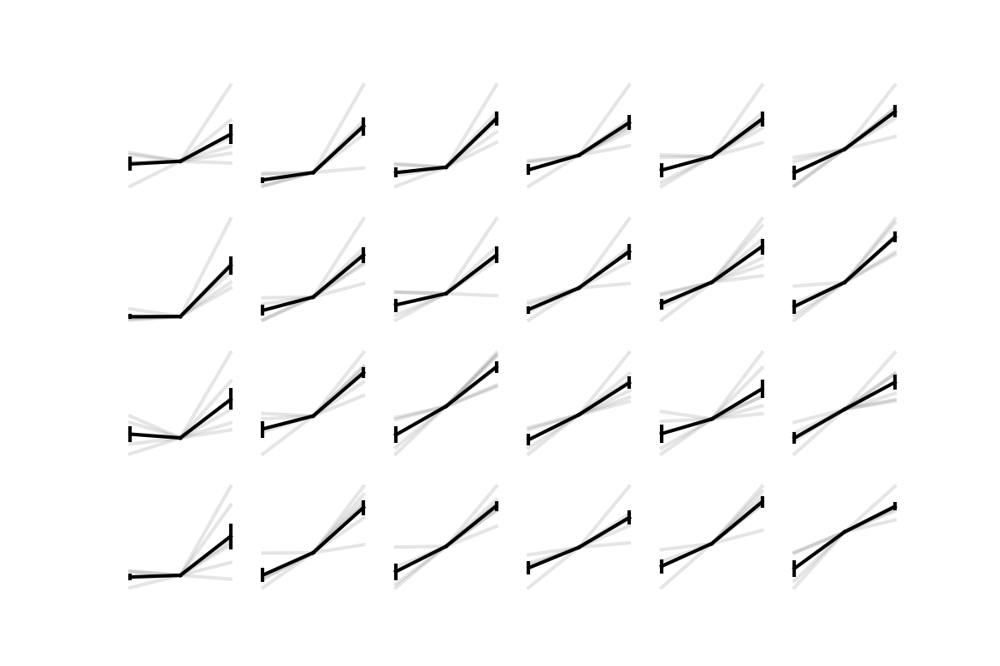

In [217]:
alpha = 0.1
plt.figure(figsize=(ncontrast,nsize))
for i in range(nsize):
    for j in range(ncontrast):
        plt.subplot(nsize,ncontrast,ncontrast*i+j+1)
        data = YY_chrimson_orig[:,i,j] - YY_chrimson_orig[:,i,j,0:1]
        plot_bars_and_lines((0,1),data,alpha=alpha)
        data = YY_halo_orig[:,i,j] - YY_halo_orig[:,i,j,0:1]
        plot_bars_and_lines((0,-1),data,alpha=alpha)
        plt.axis('off')

<IPython.core.display.Javascript object>


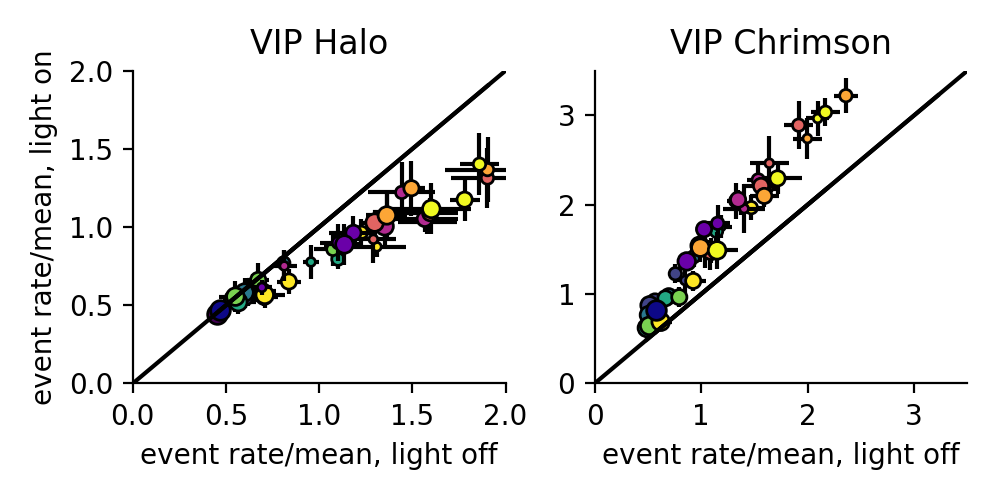

In [85]:
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
data = YY_halo_orth#np.nanmean(YY_halo_orth,0)
sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True)
data = YY_halo_orig#np.nanmean(0)
sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True,colormap=plt.cm.plasma)
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.ylabel('event rate/mean, light on')
plt.title('VIP Halo')
lim = (0,2)
plt.plot(lim,lim,c='k')
plt.xlim(lim)
plt.ylim(lim)
plt.subplot(1,2,2)
data = YY_chrimson_orth#np.nanmean(,0)
sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True)
data = YY_chrimson_orig#np.nanmean(,0)
sca.scatter_size_contrast_errorbar(data[:,:,:,0],data[:,:,:,1],equate_0=True,colormap=plt.cm.plasma)
ut.erase_top_right()
plt.xlabel('event rate/mean, light off')
plt.title('VIP Chrimson')
lim = (0,3.5)
plt.plot(lim,lim,c='k')
plt.xlim(lim)
plt.ylim(lim)
plt.tight_layout()
# plt.savefig('figures/vip_opto_angle_light_on_light_off_scatter_errorbar.eps')

In [181]:
data.shape

(6, 2)

In [139]:
import scipy.stats as sst
slope, intercept, r_value, p_value, std_err = sst.linregress(dYY_halo[:,itype].flatten(),dYY_chrimson[:,itype].flatten())

In [140]:
slope = (np.linalg.pinv(dYY_halo[:,itype:itype+1]) @ dYY_chrimson[:,itype:itype+1])[0,0]

<IPython.core.display.Javascript object>


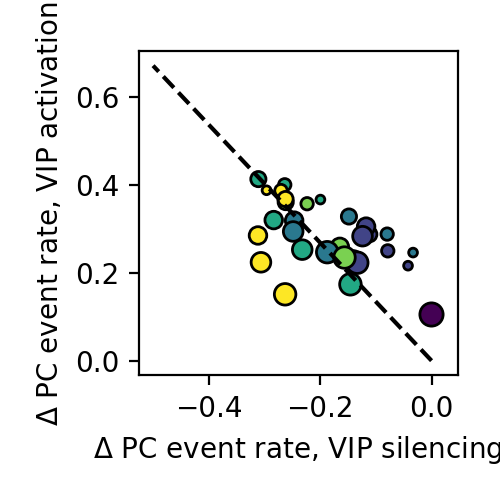

In [141]:
plt.figure(figsize=(2.5,2.5))
itype = 0
sca.scatter_size_contrast(dYY_halo[:,itype],dYY_chrimson[:,itype],nsize=6,ncontrast=6,equality_line=False,square=False,equate_0=True)
x = -np.array((0,0.5))
plt.plot(x,slope*x,c='k',linestyle='dashed')
plt.xlabel('$\Delta$ PC event rate, VIP silencing')
plt.ylabel('$\Delta$ PC event rate, VIP activation')
plt.tight_layout()

<IPython.core.display.Javascript object>


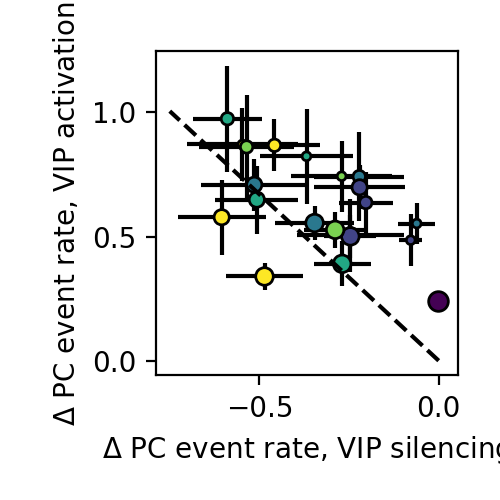

In [159]:
plt.figure(figsize=(2.5,2.5))
itype = 0
sca.scatter_size_contrast_errorbar(dYY_halo_orig,dYY_chrimson_orig,nsize=4,ncontrast=6,equality_line=False,square=False,equate_0=True)
x = -np.array((0,0.75))
plt.plot(x,slope*x,c='k',linestyle='dashed')
plt.xlabel('$\Delta$ PC event rate, VIP silencing')
plt.ylabel('$\Delta$ PC event rate, VIP activation')
plt.tight_layout()

In [162]:
data = (np.nanmean(dYY_chrimson_orig,0) - slope*np.nanmean(dYY_halo_orig,0))

In [163]:
plt.figure()
plt.plot

(6, 4, 6)

<IPython.core.display.Javascript object>


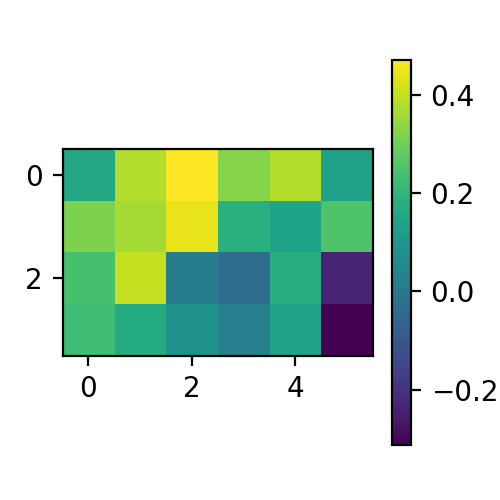

In [164]:
plt.figure(figsize=(2.5,2.5))
plt.imshow(data)
plt.colorbar()

<IPython.core.display.Javascript object>


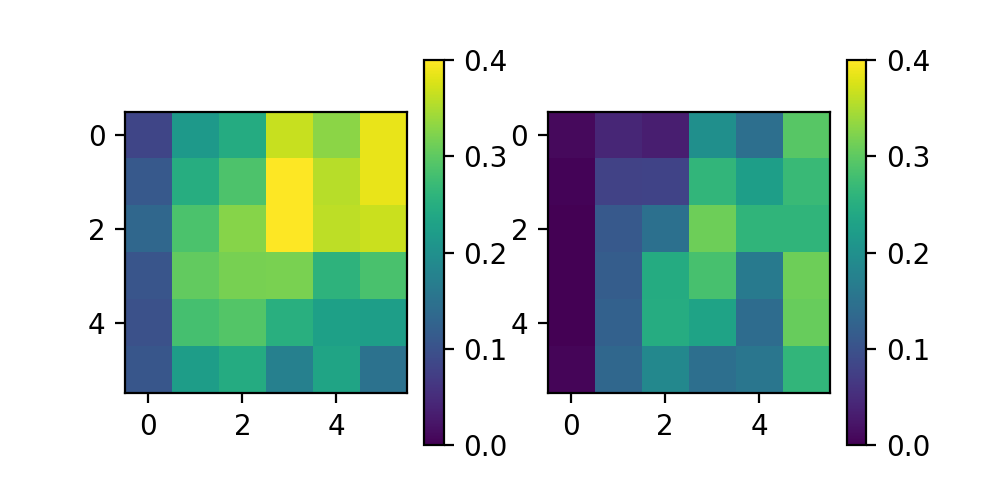

In [97]:
mn,mx = 0,0.4
plt.figure(figsize=(5,2.5))
plt.subplot(1,2,1)
plt.imshow(dYY_chrimson[:,itype].reshape((6,6)),vmin=mn,vmax=mx)
plt.colorbar()
plt.subplot(1,2,2)
plt.imshow(-dYY_halo[:,itype].reshape((6,6)),vmin=mn,vmax=mx)
plt.colorbar()

<IPython.core.display.Javascript object>


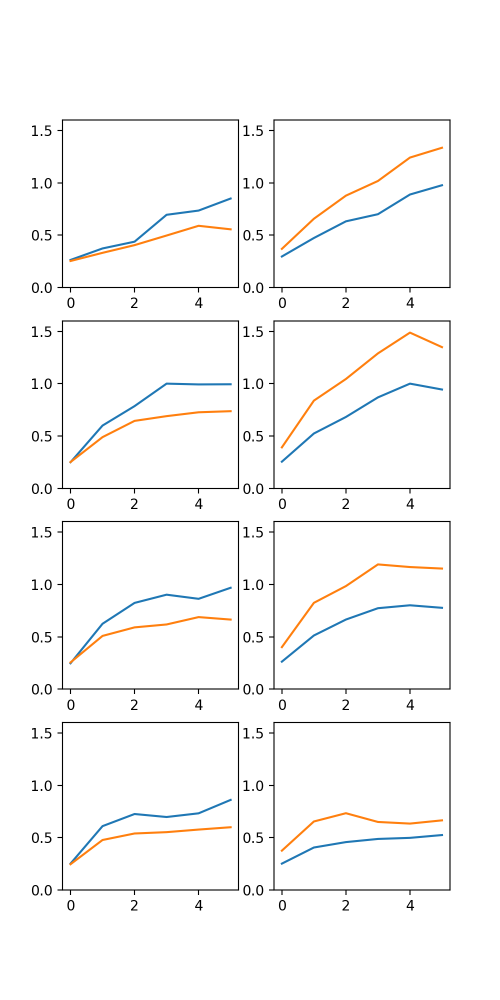

In [60]:
x = np.arange(6)
isize = 5
ylim = (0,1.6)
plt.figure(figsize=(5,10))
for iisize,isize in enumerate([0,2,3,5]):
    plt.subplot(4,2,2*iisize+1)
    plt.plot(x,Yhat_halo[0::2,0].reshape((6,6))[isize,:])
    plt.plot(x,Yhat_halo[1::2,0].reshape((6,6))[isize,:])
    plt.ylim(ylim)
    plt.subplot(4,2,2*iisize+2)
    plt.plot(x,Yhat_chrimson[0::2,0].reshape((6,6))[isize,:])
    plt.plot(x,Yhat_chrimson[1::2,0].reshape((6,6))[isize,:])
    plt.ylim(ylim)

In [ ]:
x = np.arange(6)
isize = 5
ylim = (0,1.6)
plt.figure(figsize=(5,10))
for iisize,isize in enumerate([0,2,3,5]):
    plt.subplot(4,2,2*iisize+1)
    plt.plot(x,Yhat_halo[0::2,0].reshape((6,6))[isize,:])
    plt.plot(x,Yhat_halo[1::2,0].reshape((6,6))[isize,:])
    plt.ylim(ylim)
    plt.subplot(4,2,2*iisize+2)
    plt.plot(x,Yhat_chrimson[0::2,0].reshape((6,6))[isize,:])
    plt.plot(x,Yhat_chrimson[1::2,0].reshape((6,6))[isize,:])
    plt.ylim(ylim)

<IPython.core.display.Javascript object>


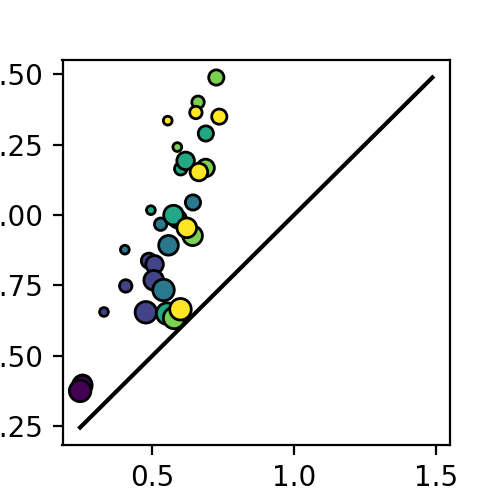

<IPython.core.display.Javascript object>


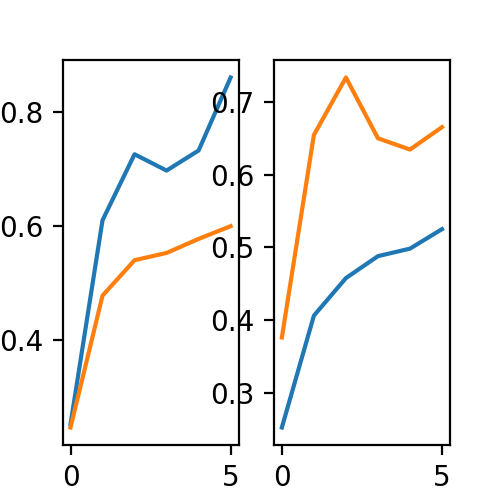

In [43]:
for itype in [0,2]:
    plt.figure(figsize=(2.5,2.5))
    sca.scatter_size_contrast(Yhat_halo[1::2,itype],Yhat_chrimson[1::2,itype],nsize=6,ncontrast=6)

<IPython.core.display.Javascript object>


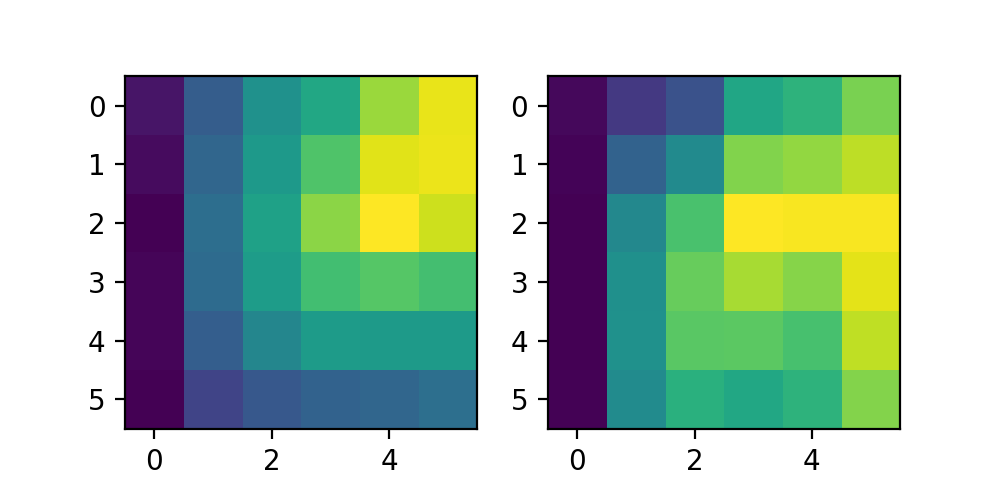

<IPython.core.display.Javascript object>


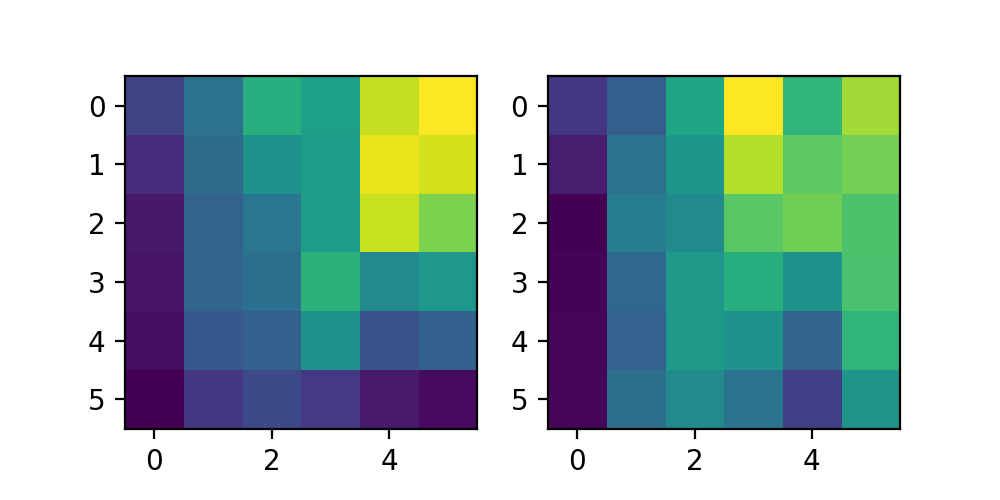

In [38]:
for itype in [0,2]:
    plt.figure(figsize=(5,2.5))
    plt.subplot(1,2,1)
    plt.imshow(Yhat_chrimson[0::2,itype].reshape((6,6)))
    plt.subplot(1,2,2)
    plt.imshow(Yhat_halo[0::2,itype].reshape((6,6)))